# SEAMLESS PHOTOVOLTAIC POWER GENERATION FORECASTING

# Install

In [ ]:
pip install dtw-python

In [2]:
pip install fastdtw

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install gmdh

  Obtaining dependency information for gmdh from https://files.pythonhosted.org/packages/00/34/f79cc9abe778264a4a7fe4cae9071c8fe4af0bef2a7cb3b962640ace41aa/gmdh-1.0.3-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for docstring-inheritance from https://files.pythonhosted.org/packages/da/0d/9a0021dd85a38afccca3e970ef049afd5a4791811059a2d7d18e10404b73/docstring_inheritance-2.0.2-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/365.2 kB ? eta -:--:--
   ------------ --------------------------- 112.6/365.2 kB 3.2 MB/s eta 0:00:01
   ------------------- -------------------- 174.1/365.2 kB 2.1 MB/s eta 0:00:01
   -------------------------------- ------- 297.0/365.2 kB 2.3 MB/s eta 0:00:01
   ---------------------------------------- 365.2/365.2 kB 2.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install gmdhpy

Note: you may need to restart the kernel to use updated packages.


# Import

In [1]:
import tarfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import neighbors, datasets, preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import seaborn as sns
from dtw import *
from fastdtw import fastdtw
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import gmdh
from gmdh import Combi
import gmdhpy
from statsmodels.tsa.api import AutoReg
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import TimeSeriesSplit

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



# Get the Data And fill missing values

In [2]:
file="destination_folder/E4Cast-solar/GHI_smooth_20170701-20200630_T0+{}min.csv"
column_name="Sat_GHI_T0+{}"

We have 25 files. One for each time horizon of Satellite prediction. On every 15 minutes for 6 hours.
Each dataset contains exacltly the same values exeplte for the satellite prediction columns. We need to regroup them into one dataset.

First we download each files

In [3]:
list_df_sat=[]
for i in range(0,375,15):
    file_i=file.format(i)
    column_name_i=column_name.format(i)
    df_i=pd.read_csv(file_i,sep=',',header=0,parse_dates=['date'])
    #for each data frame we change the Satellite colomn to specify the prediction time
    df_i=df_i.rename(columns={"Sat_GHI":column_name_i})
    #setting date as the index before mergig the data frames
    df_i.set_index('date', inplace=True)
    #we use interpolate for the missing values
    df_i=df_i.interpolate()
    list_df_sat.append(df_i)

# Merging data frames

Then we merge the files, using the T0+0 files and adding each satelite value to it.

In [4]:
df=list_df_sat[0].copy()
for i in range(1,len(list_df_sat)):
    df=df.merge(list_df_sat[i][[column_name.format(i*15)]], left_index=True, right_index=True, how='outer')

In [5]:
df.head().T

date,2017-07-01 05:11:00,2017-07-01 05:26:00,2017-07-01 05:41:00,2017-07-01 05:56:00,2017-07-01 06:11:00
Sirta_GHI,12.172667,16.694667,30.220667,46.928667,50.004667
Sat_GHI_T0+0,46.639333,46.641917,34.287182,52.639118,73.049175
Clearsky_GHI,119.292611,156.593875,195.732357,236.267183,277.824905
Arpege_GHI,11.261829,13.609398,18.504805,24.326697,30.148590
SZA,79.702292,77.410452,75.078445,72.711278,70.313885
Kc_Sat_mean,0.389356,0.235036,0.195269,0.267614,0.204141
Kc_Sat_std,0.100030,0.071296,0.036872,0.051194,0.053714
Kc_obs,0.102040,0.106611,0.154398,0.198625,0.179986
Wreg,2.000000,2.000000,2.000000,2.000000,2.000000
Sat_GHI_T0+15,NaN,60.436766,48.905194,37.655484,83.924422


# First Data visualization

In [6]:
df.dtypes

Sirta_GHI         float64
Sat_GHI_T0+0      float64
Clearsky_GHI      float64
Arpege_GHI        float64
SZA               float64
Kc_Sat_mean       float64
Kc_Sat_std        float64
Kc_obs            float64
Wreg              float64
Sat_GHI_T0+15     float64
Sat_GHI_T0+30     float64
Sat_GHI_T0+45     float64
Sat_GHI_T0+60     float64
Sat_GHI_T0+75     float64
Sat_GHI_T0+90     float64
Sat_GHI_T0+105    float64
Sat_GHI_T0+120    float64
Sat_GHI_T0+135    float64
Sat_GHI_T0+150    float64
Sat_GHI_T0+165    float64
Sat_GHI_T0+180    float64
Sat_GHI_T0+195    float64
Sat_GHI_T0+210    float64
Sat_GHI_T0+225    float64
Sat_GHI_T0+240    float64
Sat_GHI_T0+255    float64
Sat_GHI_T0+270    float64
Sat_GHI_T0+285    float64
Sat_GHI_T0+300    float64
Sat_GHI_T0+315    float64
Sat_GHI_T0+330    float64
Sat_GHI_T0+345    float64
Sat_GHI_T0+360    float64
dtype: object

The type of each column is float which is correct all values should be float in this dataset.

array([<Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>], dtype=object)

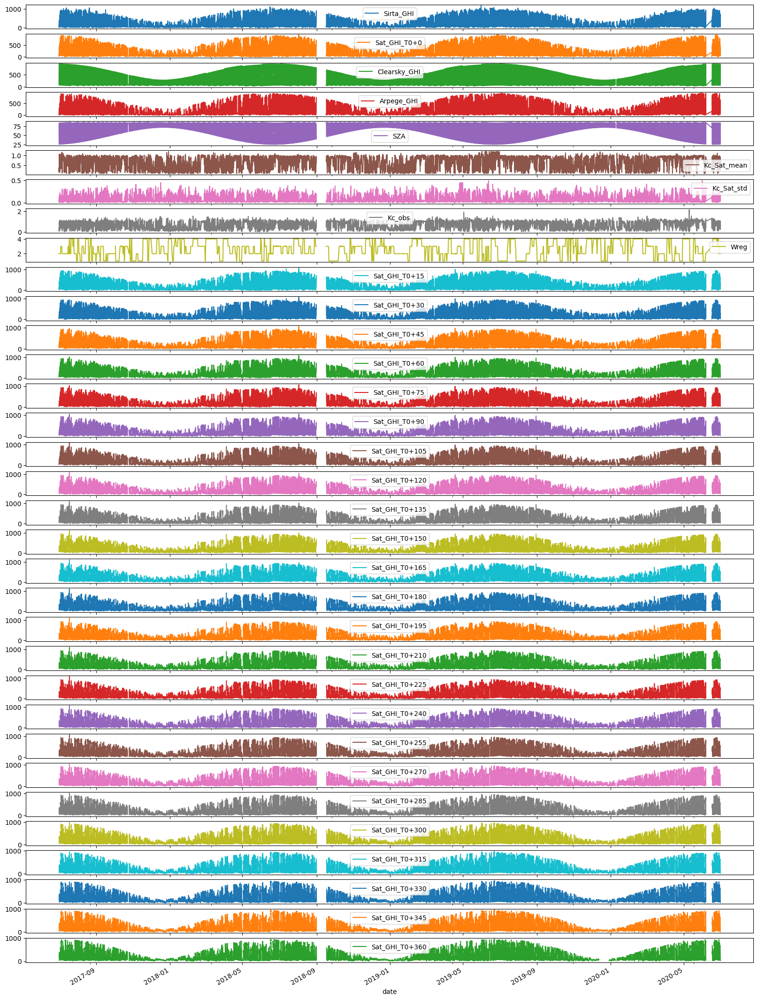

In [7]:
df.plot(subplots=True, figsize=(20,30))

We now have a visualisation of the values of each columns. We can clearly see that some periods have missing values due to technical problems with captures.


# Missing values

Before starting the predictions we need to deal with the missing values

In [8]:
df.isnull().sum()

Sirta_GHI           338
Sat_GHI_T0+0        338
Clearsky_GHI        338
Arpege_GHI          338
SZA                 338
Kc_Sat_mean         338
Kc_Sat_std          338
Kc_obs              338
Wreg                338
Sat_GHI_T0+15      1399
Sat_GHI_T0+30      2461
Sat_GHI_T0+45      3524
Sat_GHI_T0+60      4586
Sat_GHI_T0+75      5648
Sat_GHI_T0+90      6709
Sat_GHI_T0+105     7770
Sat_GHI_T0+120     8832
Sat_GHI_T0+135     9893
Sat_GHI_T0+150    10952
Sat_GHI_T0+165    12009
Sat_GHI_T0+180    13067
Sat_GHI_T0+195    14125
Sat_GHI_T0+210    15183
Sat_GHI_T0+225    16241
Sat_GHI_T0+240    17297
Sat_GHI_T0+255    18351
Sat_GHI_T0+270    19397
Sat_GHI_T0+285    20436
Sat_GHI_T0+300    21482
Sat_GHI_T0+315    22535
Sat_GHI_T0+330    23587
Sat_GHI_T0+345    24642
Sat_GHI_T0+360    25698
dtype: int64

We can see that each columns has 338 missing values which must correspond to the empty periods we saw in the plots earlier. Let's have a better look at the values.

In [9]:
df[df['Sirta_GHI'].isna()].index.year.value_counts()

date
2018    175
2019    119
2020     24
2017     20
Name: count, dtype: int64

338 rows out of 44000 is not a lot, for now we can drop them.

We may comeback to this decision later and replace the values with other ones (from the day before or the past year)

In [10]:
df.dropna(subset=['Sirta_GHI'], inplace=True)

In [11]:
df.isnull().sum()

Sirta_GHI             0
Sat_GHI_T0+0          0
Clearsky_GHI          0
Arpege_GHI            0
SZA                   0
Kc_Sat_mean           0
Kc_Sat_std            0
Kc_obs                0
Wreg                  0
Sat_GHI_T0+15      1175
Sat_GHI_T0+30      2346
Sat_GHI_T0+45      3435
Sat_GHI_T0+60      4511
Sat_GHI_T0+75      5577
Sat_GHI_T0+90      6638
Sat_GHI_T0+105     7701
Sat_GHI_T0+120     8766
Sat_GHI_T0+135     9831
Sat_GHI_T0+150    10888
Sat_GHI_T0+165    11914
Sat_GHI_T0+180    12944
Sat_GHI_T0+195    14000
Sat_GHI_T0+210    15056
Sat_GHI_T0+225    16115
Sat_GHI_T0+240    17172
Sat_GHI_T0+255    18223
Sat_GHI_T0+270    19264
Sat_GHI_T0+285    20292
Sat_GHI_T0+300    21319
Sat_GHI_T0+315    22352
Sat_GHI_T0+330    23392
Sat_GHI_T0+345    24441
Sat_GHI_T0+360    25493
dtype: int64

Satellite prediction is based on satelittes images of the clouds. Unfortunatly it can not caculate anything during night time. This is why we still have a lot of missing values for each satelite prediction.

To avoid dropping the 6 first hours of each day away we will simply replace each missing values with zero. It may be a good idea to replace it with an other values such as the one from the day before but it may lead to wrong conclusion later.

In [12]:
df.fillna(0, inplace=True)

In [13]:
df.isnull().sum()

Sirta_GHI         0
Sat_GHI_T0+0      0
Clearsky_GHI      0
Arpege_GHI        0
SZA               0
Kc_Sat_mean       0
Kc_Sat_std        0
Kc_obs            0
Wreg              0
Sat_GHI_T0+15     0
Sat_GHI_T0+30     0
Sat_GHI_T0+45     0
Sat_GHI_T0+60     0
Sat_GHI_T0+75     0
Sat_GHI_T0+90     0
Sat_GHI_T0+105    0
Sat_GHI_T0+120    0
Sat_GHI_T0+135    0
Sat_GHI_T0+150    0
Sat_GHI_T0+165    0
Sat_GHI_T0+180    0
Sat_GHI_T0+195    0
Sat_GHI_T0+210    0
Sat_GHI_T0+225    0
Sat_GHI_T0+240    0
Sat_GHI_T0+255    0
Sat_GHI_T0+270    0
Sat_GHI_T0+285    0
Sat_GHI_T0+300    0
Sat_GHI_T0+315    0
Sat_GHI_T0+330    0
Sat_GHI_T0+345    0
Sat_GHI_T0+360    0
dtype: int64

No remaining missing values.

# Wreg binary columns

Wreg are weather regimes, there is four types, the number associated does not make sens in a linear regression for exemple because a Wreg=4 is not closer to 3 than 1.
We are separating it into 4 binary columns so the number does not impact the result.

In [14]:
df = pd.get_dummies(df, columns=['Wreg'], prefix='Wreg')

In [15]:
df.head().T

date,2017-07-01 05:11:00,2017-07-01 05:26:00,2017-07-01 05:41:00,2017-07-01 05:56:00,2017-07-01 06:11:00
Sirta_GHI,12.172667,16.694667,30.220667,46.928667,50.004667
Sat_GHI_T0+0,46.639333,46.641917,34.287182,52.639118,73.049175
Clearsky_GHI,119.292611,156.593875,195.732357,236.267183,277.824905
Arpege_GHI,11.261829,13.609398,18.504805,24.326697,30.14859
SZA,79.702292,77.410452,75.078445,72.711278,70.313885
Kc_Sat_mean,0.389356,0.235036,0.195269,0.267614,0.204141
Kc_Sat_std,0.10003,0.071296,0.036872,0.051194,0.053714
Kc_obs,0.10204,0.106611,0.154398,0.198625,0.179986
Sat_GHI_T0+15,0.0,60.436766,48.905194,37.655484,83.924422
Sat_GHI_T0+30,0.0,0.0,68.602462,64.199038,40.746849


# Sirta 24h before

We decided to had a new column 'Sirta_GHI_T0-1j' that give us information about the real GHI observed 24h before. We can use is to make day-head prediction

In [16]:
df['Sirta_GHI_T0-1j']=df['Sirta_GHI'].shift(1,freq='D')

In [17]:
df.isna().sum()

Sirta_GHI            0
Sat_GHI_T0+0         0
Clearsky_GHI         0
Arpege_GHI           0
SZA                  0
Kc_Sat_mean          0
Kc_Sat_std           0
Kc_obs               0
Sat_GHI_T0+15        0
Sat_GHI_T0+30        0
Sat_GHI_T0+45        0
Sat_GHI_T0+60        0
Sat_GHI_T0+75        0
Sat_GHI_T0+90        0
Sat_GHI_T0+105       0
Sat_GHI_T0+120       0
Sat_GHI_T0+135       0
Sat_GHI_T0+150       0
Sat_GHI_T0+165       0
Sat_GHI_T0+180       0
Sat_GHI_T0+195       0
Sat_GHI_T0+210       0
Sat_GHI_T0+225       0
Sat_GHI_T0+240       0
Sat_GHI_T0+255       0
Sat_GHI_T0+270       0
Sat_GHI_T0+285       0
Sat_GHI_T0+300       0
Sat_GHI_T0+315       0
Sat_GHI_T0+330       0
Sat_GHI_T0+345       0
Sat_GHI_T0+360       0
Wreg_1.0             0
Wreg_2.0             0
Wreg_3.0             0
Wreg_4.0             0
Sirta_GHI_T0-1j    768
dtype: int64

As some time periode are not reprented in the dataset we have 768 missing values. We can use ffill() to fill the missing values using the values from the day before.

In [18]:
df['Sirta_GHI_T0-1j']=df['Sirta_GHI_T0-1j'].ffill()

In [19]:
df.isna().sum()

Sirta_GHI           0
Sat_GHI_T0+0        0
Clearsky_GHI        0
Arpege_GHI          0
SZA                 0
Kc_Sat_mean         0
Kc_Sat_std          0
Kc_obs              0
Sat_GHI_T0+15       0
Sat_GHI_T0+30       0
Sat_GHI_T0+45       0
Sat_GHI_T0+60       0
Sat_GHI_T0+75       0
Sat_GHI_T0+90       0
Sat_GHI_T0+105      0
Sat_GHI_T0+120      0
Sat_GHI_T0+135      0
Sat_GHI_T0+150      0
Sat_GHI_T0+165      0
Sat_GHI_T0+180      0
Sat_GHI_T0+195      0
Sat_GHI_T0+210      0
Sat_GHI_T0+225      0
Sat_GHI_T0+240      0
Sat_GHI_T0+255      0
Sat_GHI_T0+270      0
Sat_GHI_T0+285      0
Sat_GHI_T0+300      0
Sat_GHI_T0+315      0
Sat_GHI_T0+330      0
Sat_GHI_T0+345      0
Sat_GHI_T0+360      0
Wreg_1.0            0
Wreg_2.0            0
Wreg_3.0            0
Wreg_4.0            0
Sirta_GHI_T0-1j    57
dtype: int64

57 missing values, this correpond well at the number of values by day.

In [20]:
df.fillna(0, inplace=True)

In [21]:
df.isna().sum()

Sirta_GHI          0
Sat_GHI_T0+0       0
Clearsky_GHI       0
Arpege_GHI         0
SZA                0
Kc_Sat_mean        0
Kc_Sat_std         0
Kc_obs             0
Sat_GHI_T0+15      0
Sat_GHI_T0+30      0
Sat_GHI_T0+45      0
Sat_GHI_T0+60      0
Sat_GHI_T0+75      0
Sat_GHI_T0+90      0
Sat_GHI_T0+105     0
Sat_GHI_T0+120     0
Sat_GHI_T0+135     0
Sat_GHI_T0+150     0
Sat_GHI_T0+165     0
Sat_GHI_T0+180     0
Sat_GHI_T0+195     0
Sat_GHI_T0+210     0
Sat_GHI_T0+225     0
Sat_GHI_T0+240     0
Sat_GHI_T0+255     0
Sat_GHI_T0+270     0
Sat_GHI_T0+285     0
Sat_GHI_T0+300     0
Sat_GHI_T0+315     0
Sat_GHI_T0+330     0
Sat_GHI_T0+345     0
Sat_GHI_T0+360     0
Wreg_1.0           0
Wreg_2.0           0
Wreg_3.0           0
Wreg_4.0           0
Sirta_GHI_T0-1j    0
dtype: int64

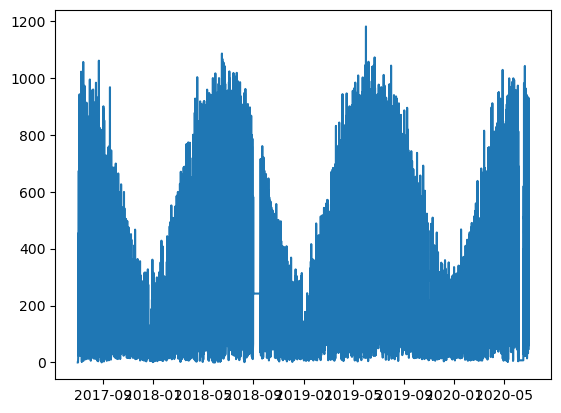

In [22]:
plt.plot(df.index, df['Sirta_GHI_T0-1j'], label='Sirta_GHI_T0-1j')

# Data info

Now we have all of the data we need, let's look at it more closely.

In [23]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Sirta_GHI,44539.0,323.375591,253.637674,-3.400000e-02,105.623667,255.550667,496.623333,1180.468000
Sat_GHI_T0+0,44539.0,309.087118,236.210944,5.210791e+00,106.707728,244.188805,472.150037,950.905602
Clearsky_GHI,44539.0,461.136420,247.727558,4.096680e+01,255.283408,426.517783,667.999067,945.175782
Arpege_GHI,44539.0,319.327716,253.172452,1.035075e-01,95.463566,257.857805,508.696243,927.282119
SZA,44539.0,60.273481,15.921959,2.528530e+01,48.140464,63.334046,73.180437,86.189278
Kc_Sat_mean,44539.0,0.652954,0.290575,9.000000e-02,0.391059,0.720143,0.932360,1.200000
Kc_Sat_std,44539.0,0.073646,0.062161,1.387779e-17,0.025395,0.052835,0.104316,0.490061
Kc_obs,44539.0,0.668118,0.328968,-5.831726e-04,0.366867,0.709375,0.981526,2.158090
Sat_GHI_T0+15,44539.0,306.645529,239.544173,0.000000e+00,103.217725,242.710514,472.312473,1057.130501
Sat_GHI_T0+30,44539.0,303.658439,242.656866,0.000000e+00,98.380918,241.395536,470.849316,1065.052469


# Values correlation

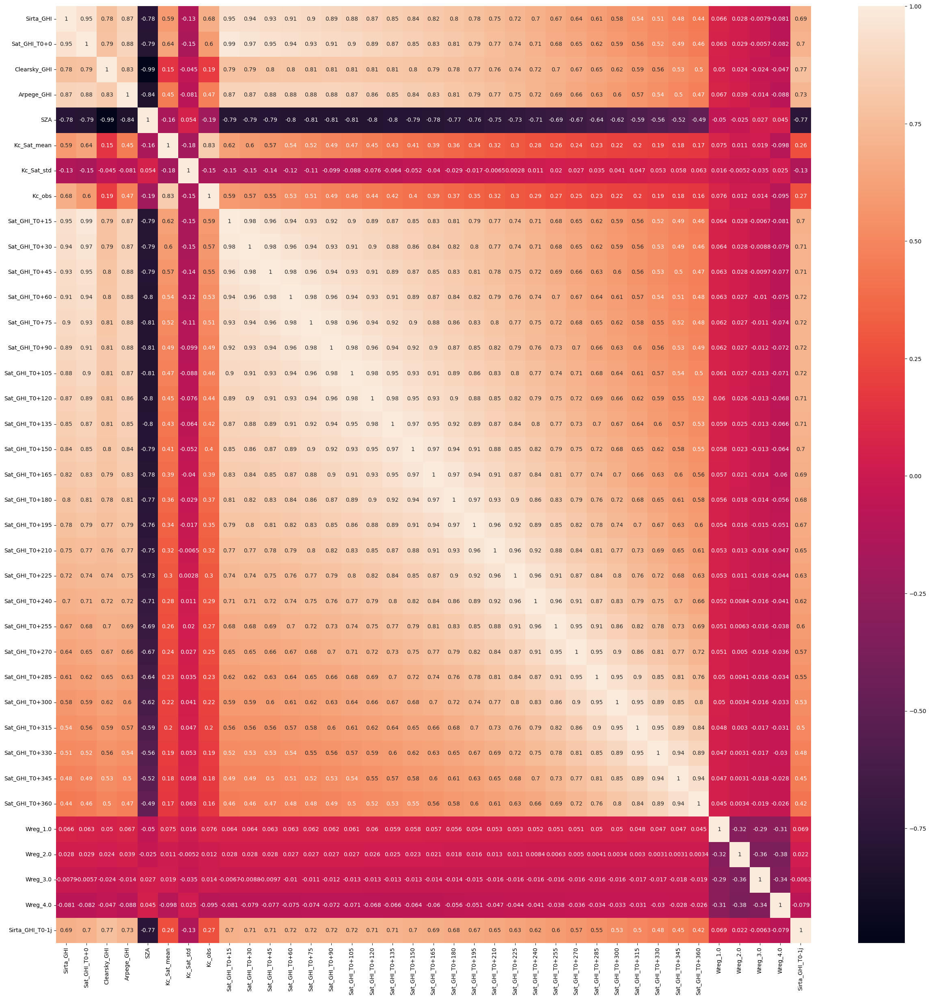

In [24]:
correlation = df.corr()
fig, ax = plt.subplots(figsize=(30,30))
sns.heatmap(correlation,annot=True)
plt.show()

# Prediction Models

In [26]:
#Two extern fils have been created to regroup all the important functions.
from graph import *
from utiles import *

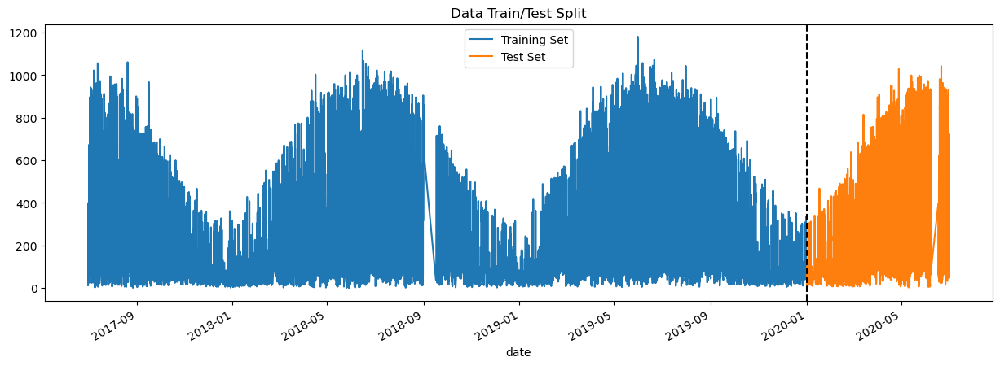

In [27]:
#Split the data
#To obtain an homogene result while testing each models at first we will make the same column selection:
df_train = df.loc[df.index<'01-01-2020'][columns_selection([360],False)]
df_test = df.loc[df.index >= '01-01-2020'][columns_selection([360],False)]
#Print the split
fig, ax = plt.subplots(figsize=(15, 5))
df_train['Sirta_GHI'].plot(ax=ax, label='Training Set', title='Data Train/Test Split')
df_test['Sirta_GHI'].plot(ax=ax, label='Test Set')
ax.axvline('01-01-2020', color='black', ls='--')
ax.legend(['Training Set', 'Test Set'])
plt.show()

In [28]:
#Part of test in the data
df_test['Sirta_GHI'].count()/df['Sirta_GHI'].count()

0.1662363322032376

In [29]:
df_train.columns

Index(['Sirta_GHI', 'Clearsky_GHI', 'Arpege_GHI', 'SZA', 'Wreg_1.0',
       'Wreg_2.0', 'Wreg_3.0', 'Wreg_4.0', 'Sirta_GHI_T0-1j',
       'Sat_GHI_T0+360'],
      dtype='object')

One of the measure used is DTW distance, let's look at each column distance from the actual resolt.

In [30]:
for col in df.columns:
    print(col," dtw distance= ",fastdtw(df['Sirta_GHI'], df[col])[0])


Sirta_GHI  dtw distance=  0.0
Sat_GHI_T0+0  dtw distance=  1561029.331888271
Clearsky_GHI  dtw distance=  8301634.41279546
Arpege_GHI  dtw distance=  2234095.5893006073
SZA  dtw distance=  11580895.063828515
Kc_Sat_mean  dtw distance=  14373727.596334316
Kc_Sat_std  dtw distance=  14399541.312092278
Kc_obs  dtw distance=  14373023.664909767
Sat_GHI_T0+15  dtw distance=  1663516.1946341307
Sat_GHI_T0+30  dtw distance=  1837633.4948554204
Sat_GHI_T0+45  dtw distance=  2015004.2505875637
Sat_GHI_T0+60  dtw distance=  2327582.2326245117
Sat_GHI_T0+75  dtw distance=  2795819.0184515463
Sat_GHI_T0+90  dtw distance=  3050355.051817399
Sat_GHI_T0+105  dtw distance=  3460536.958995842
Sat_GHI_T0+120  dtw distance=  4563868.268143959
Sat_GHI_T0+135  dtw distance=  4968195.628097282
Sat_GHI_T0+150  dtw distance=  5489561.862311738
Sat_GHI_T0+165  dtw distance=  6067877.691774103
Sat_GHI_T0+180  dtw distance=  6554009.272463929
Sat_GHI_T0+195  dtw distance=  7004966.444321546
Sat_GHI_T0+210  dtw d

## Linear Regression

We are starting the predictions with an easy model to implement: linear regression

LinearRegression()
MSE: 13420.03481723709
MAE: 84.27189115927736
R-squared: 0.8076786964130609
Distance DTW: 425644.517419113


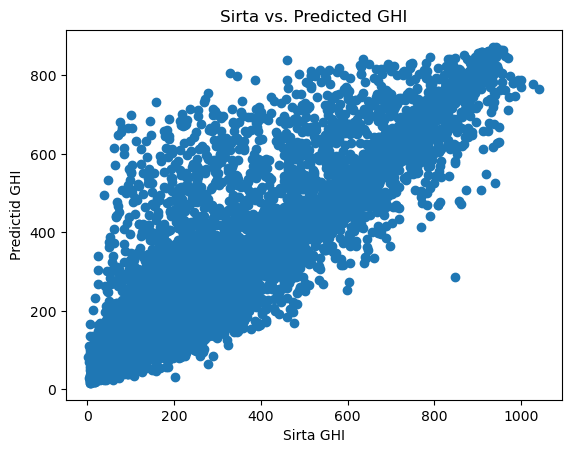

In [31]:
lr=LinearRegression()
data_lr=model_fit_prediction(df_train,df_test,lr)
evaluate_algo(lr,data_lr[3],data_lr[4])
scatter_test_pred(data_lr[3],data_lr[4])

We can see that this model is already more precise then any input column.

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

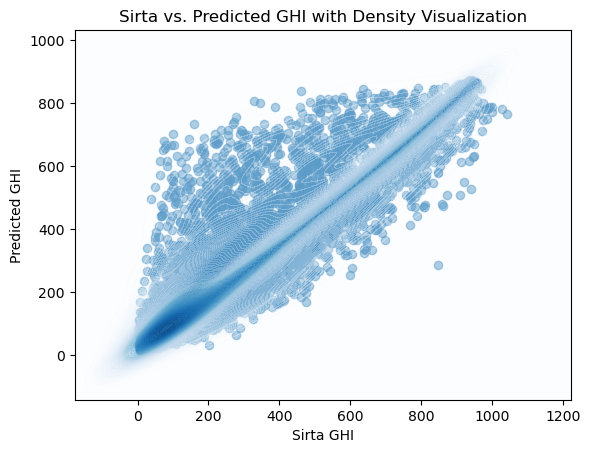

In [32]:
scatter_test_pred_density(data_lr[3],data_lr[4])

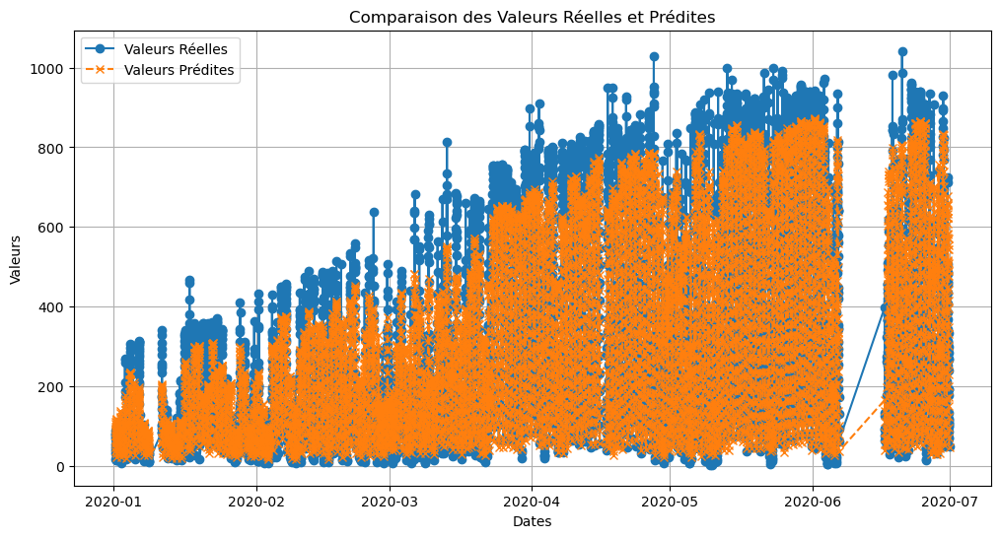

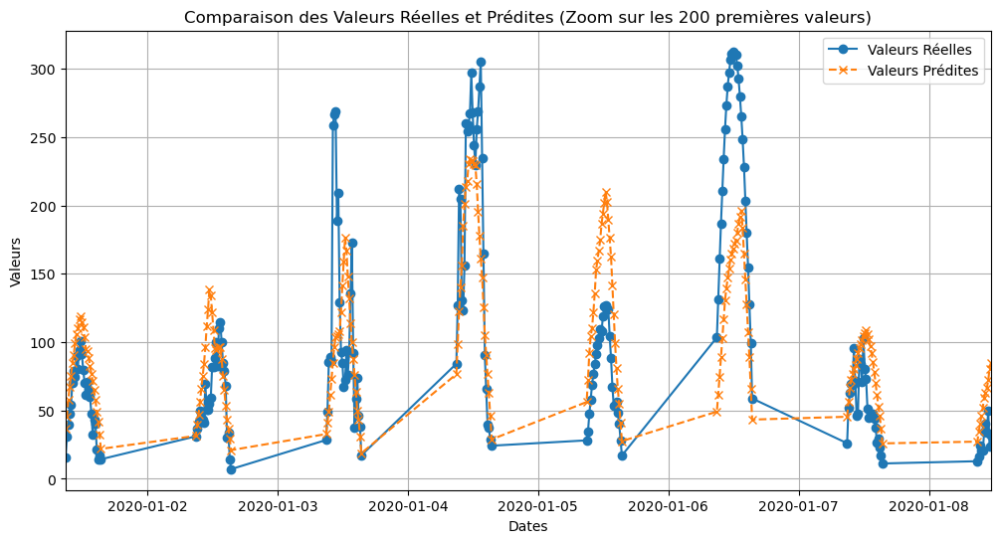

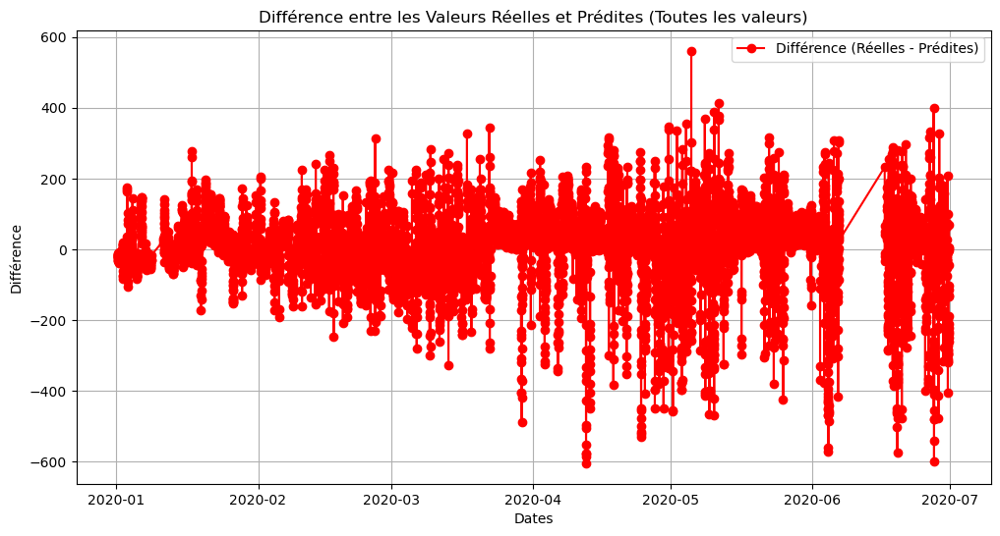

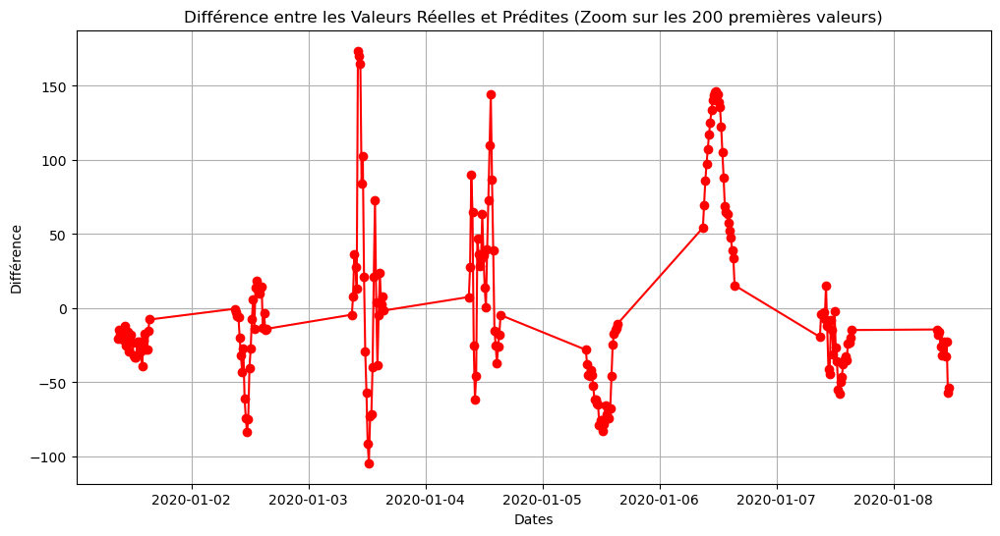

In [33]:
all_test_pred_graph(data_lr[3],data_lr[4])

We can see on this graph that the GHI is less acurate when he is the highest in the middle of the day.

# Autoregresssion

Check the stationary:

In [34]:
result = adfuller(df['Sirta_GHI'])

# Print the results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('num of lags:',result[2])
print('Critical Values:', result[4])

# Check the p-value to determine stationarity
if result[1]<=0.05:
    print("The time series is likely stationary.")
else:
    print("The time series is likely non-stationary.")

ADF Statistic: -10.817389734108414
p-value: 1.842321023458802e-19
num of lags: 55
Critical Values: {'1%': -3.430497015205759, '5%': -2.861604977524058, '10%': -2.5668045854179735}
The time series is likely stationary.


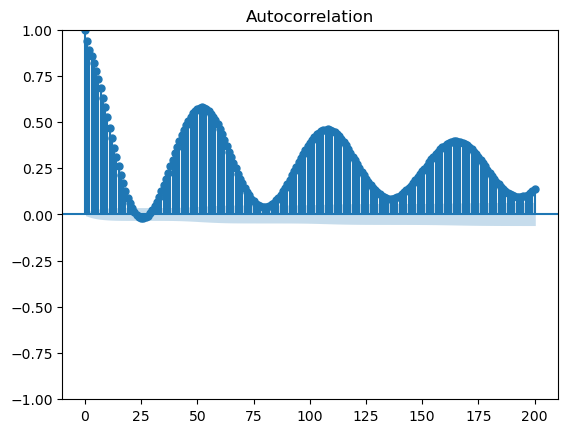

In [35]:
plot_acf(df['Sirta_GHI'], lags=200)
plt.show()

I have 57 points a day, we can see a correlation pick every 57 points which make sense because it is at the same hour the day before.

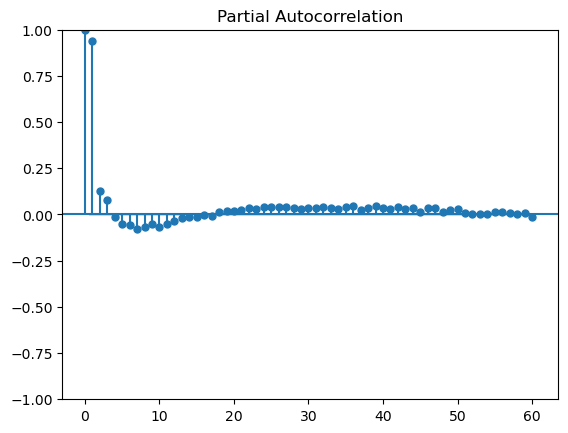

In [36]:
plot_pacf(df['Sirta_GHI'], lags=60)
plt.show()

Partial correlation is really low more than 30 minutes before the predicted point.

In [37]:
autoReg=AutoReg(df['Sirta_GHI'].values,lags=57).fit()

In [38]:
Y_pred_ar=autoReg.predict(start=len(df_train), end=len(df_train) + len(df_test) - 1)

MSE: 6486.31483885051
MAE: 51.54328009085946
R-squared: 0.9070452094743624
Distance DTW: 136445.58977260982


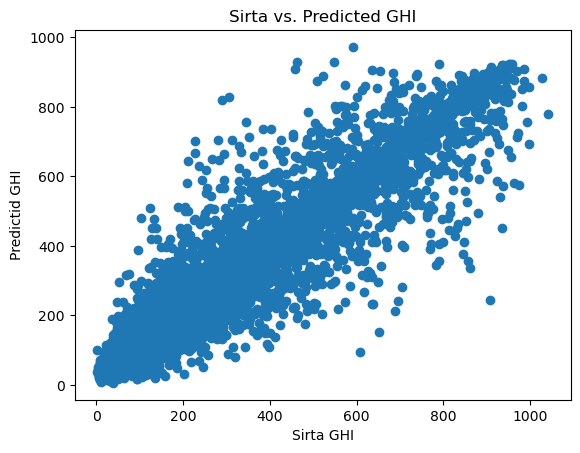

In [39]:
evaluate_algo(autoReg,df_test['Sirta_GHI'],Y_pred_ar)
scatter_test_pred(df_test['Sirta_GHI'],Y_pred_ar)

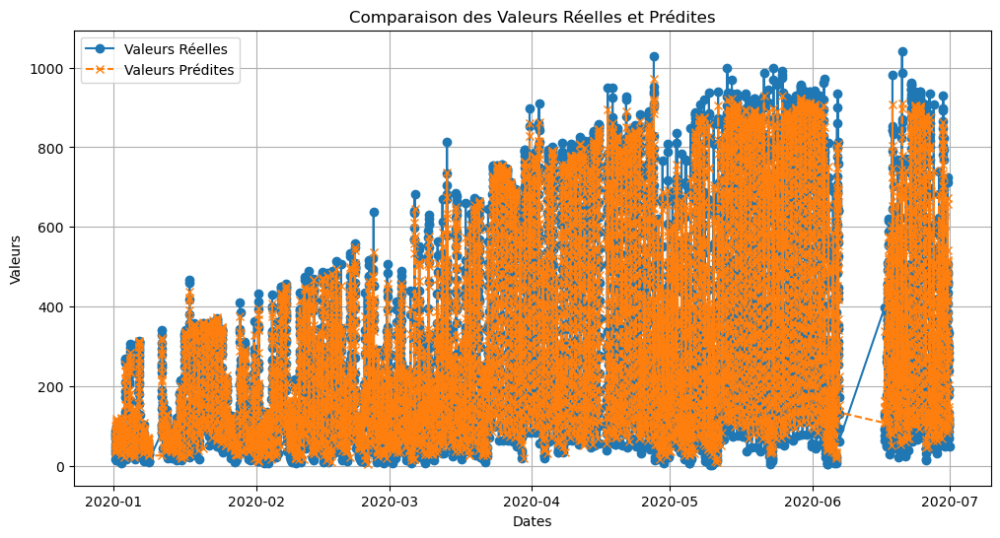

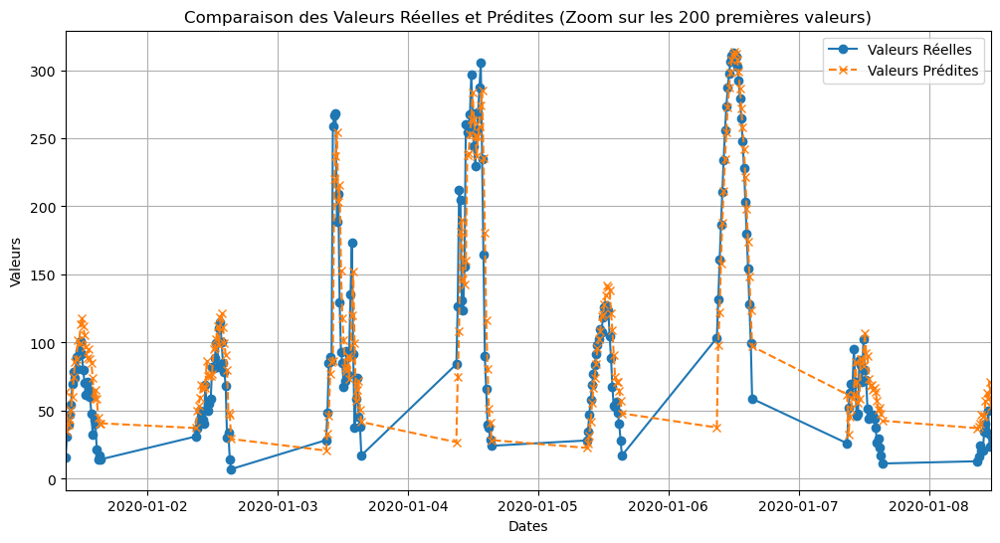

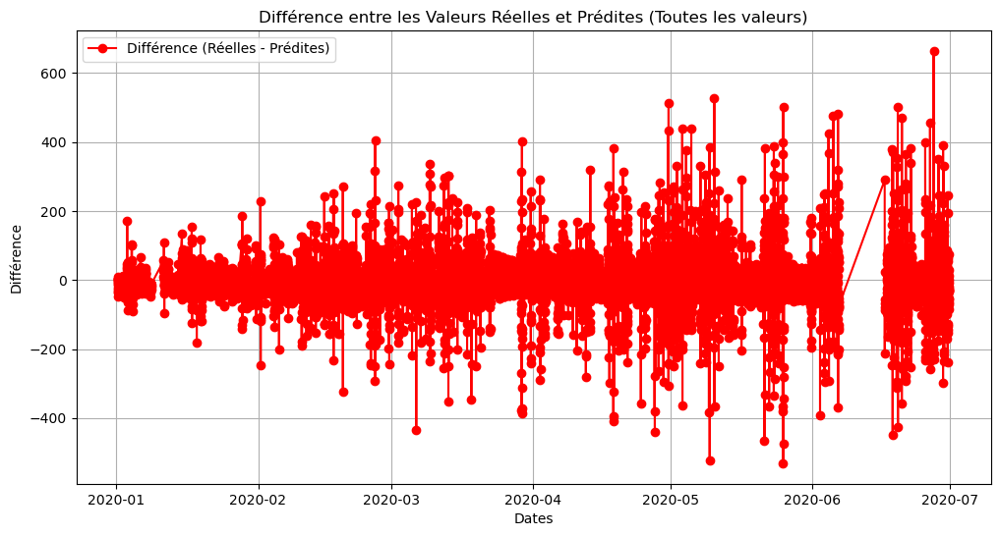

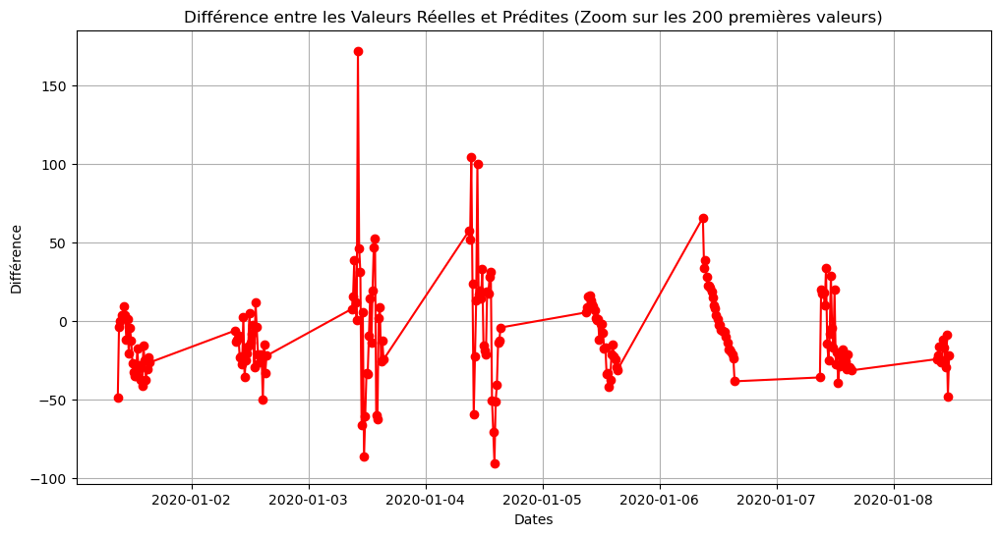

In [40]:
all_test_pred_graph(df_test['Sirta_GHI'],Y_pred_ar)

# SVR

### SVR Linear

SVR(C=1000.0, kernel='linear')
MSE: 13415.363989108888
MAE: 72.24330137681034
R-squared: 0.8077456336279549
Distance DTW: 314032.10018379876


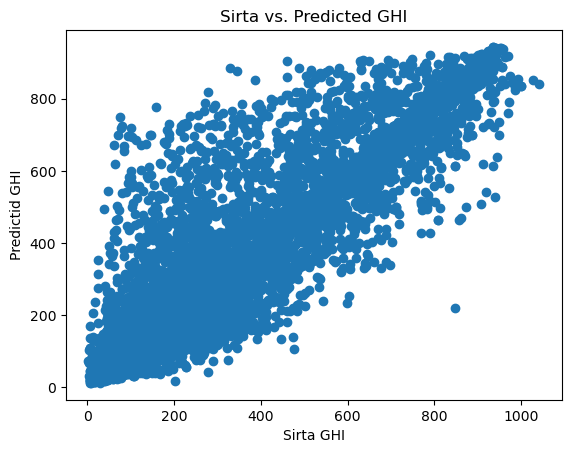

In [41]:
svr_lr=SVR(kernel= 'linear', C= 1e3)
data_svr_lr=model_fit_prediction(df_train,df_test,svr_lr)
evaluate_algo(svr_lr,data_svr_lr[3],data_svr_lr[4])
scatter_test_pred(data_svr_lr[3],data_svr_lr[4])

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

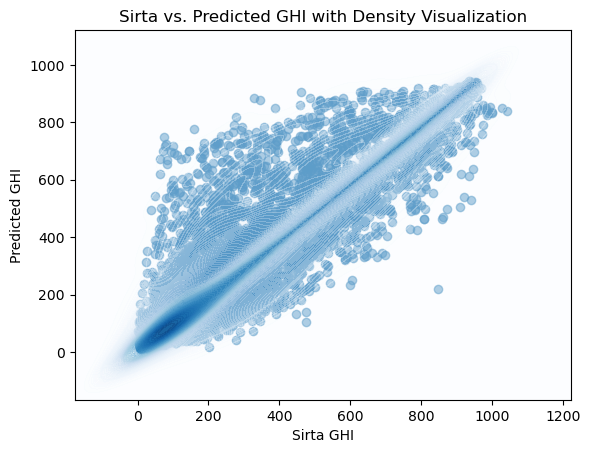

In [42]:
scatter_test_pred_density(data_svr_lr[3],data_svr_lr[4])

The results are better compared to linear regression.

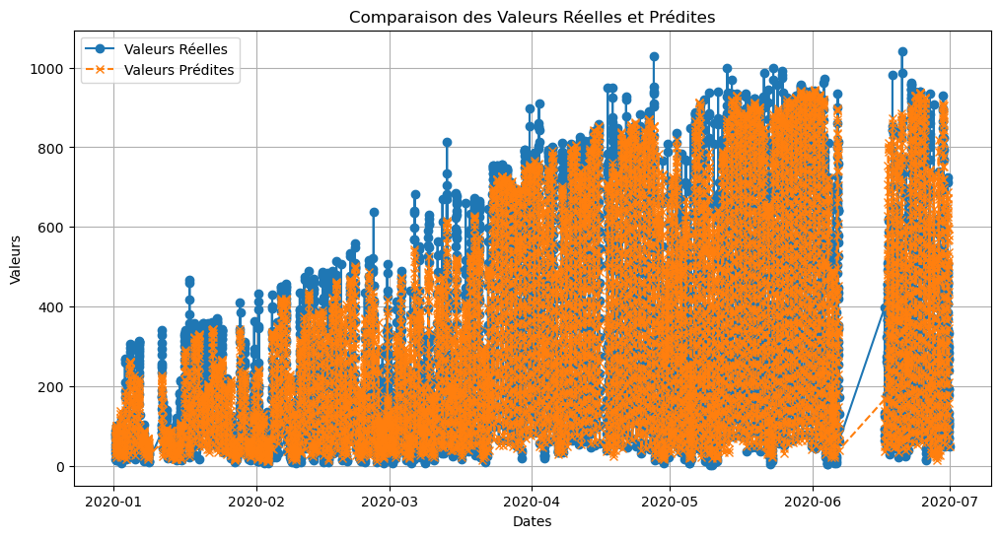

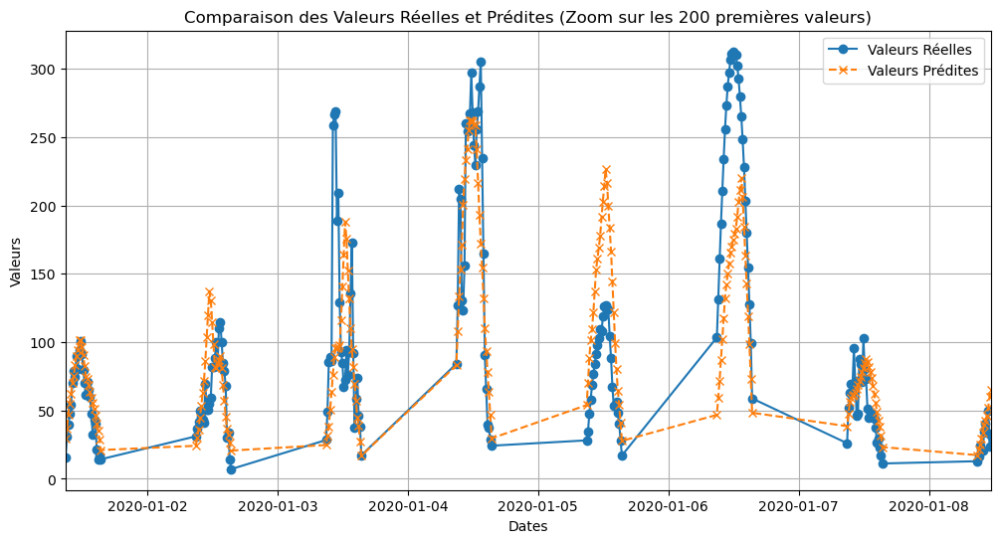

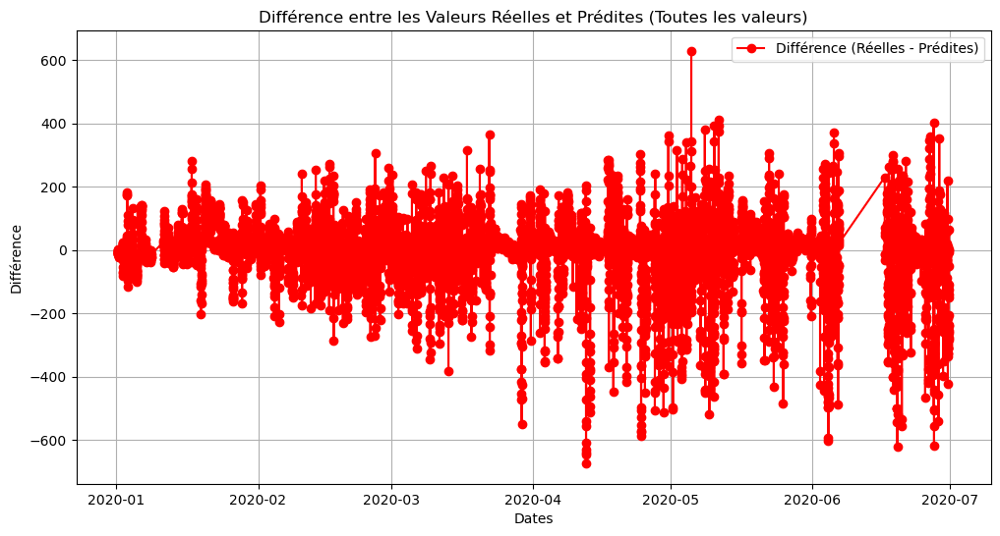

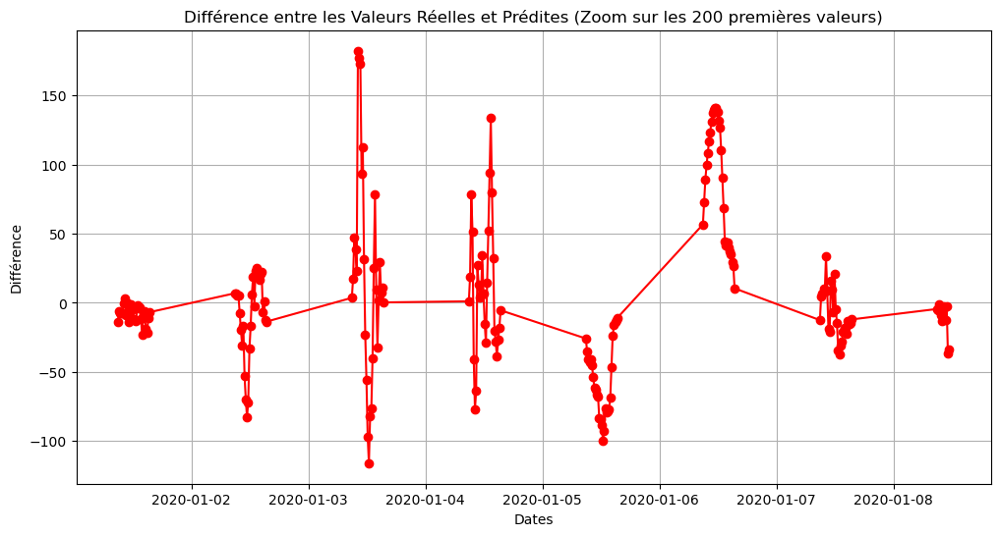

In [43]:
all_test_pred_graph(data_svr_lr[3],data_svr_lr[4])

### SVR Polynomial

SVR(C=1000.0, kernel='poly')
MSE: 13245.541085823334
MAE: 72.33049663297973
R-squared: 0.8101793502750121
Distance DTW: 315754.4513854914


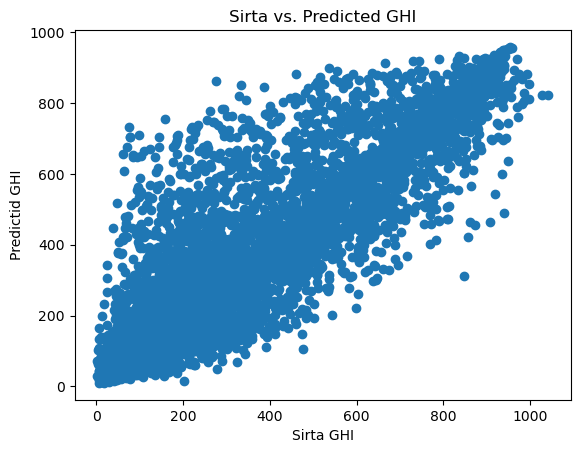

In [44]:
svr_poly=SVR(kernel= 'poly', C= 1e3)
data_svr_poly=model_fit_prediction(df_train,df_test,svr_poly)
evaluate_algo(svr_poly,data_svr_poly[3],data_svr_poly[4])
scatter_test_pred(data_svr_poly[3],data_svr_poly[4])

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

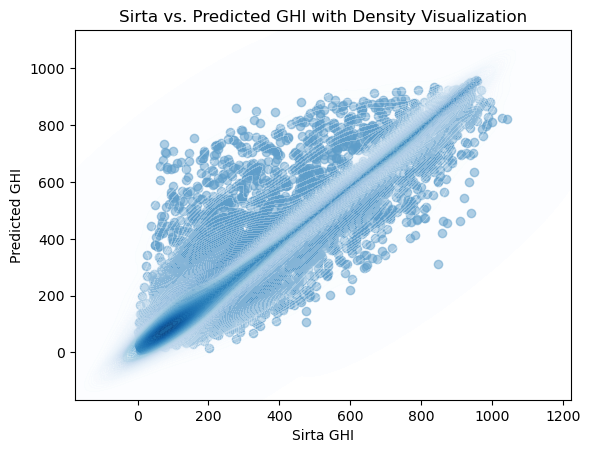

In [45]:
scatter_test_pred_density(data_svr_poly[3],data_svr_poly[4])

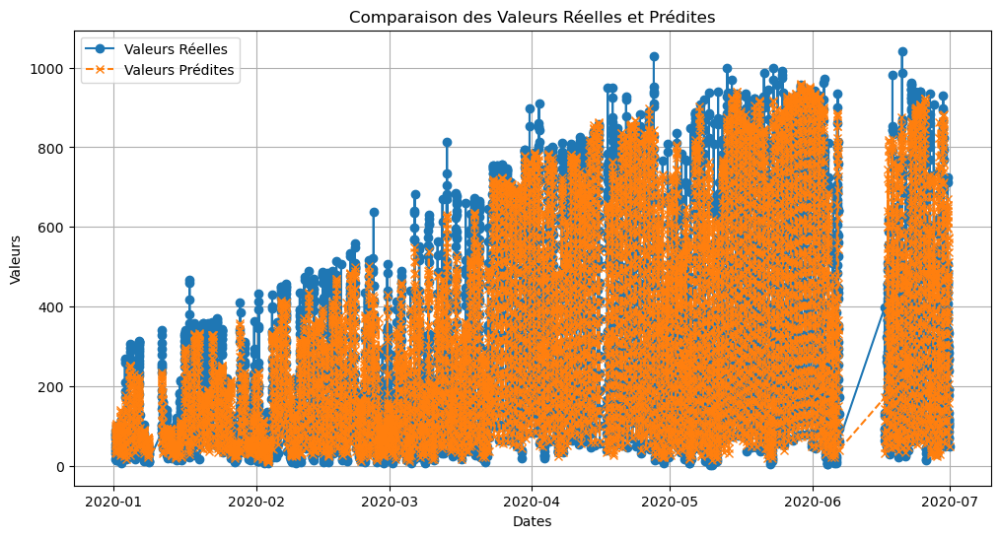

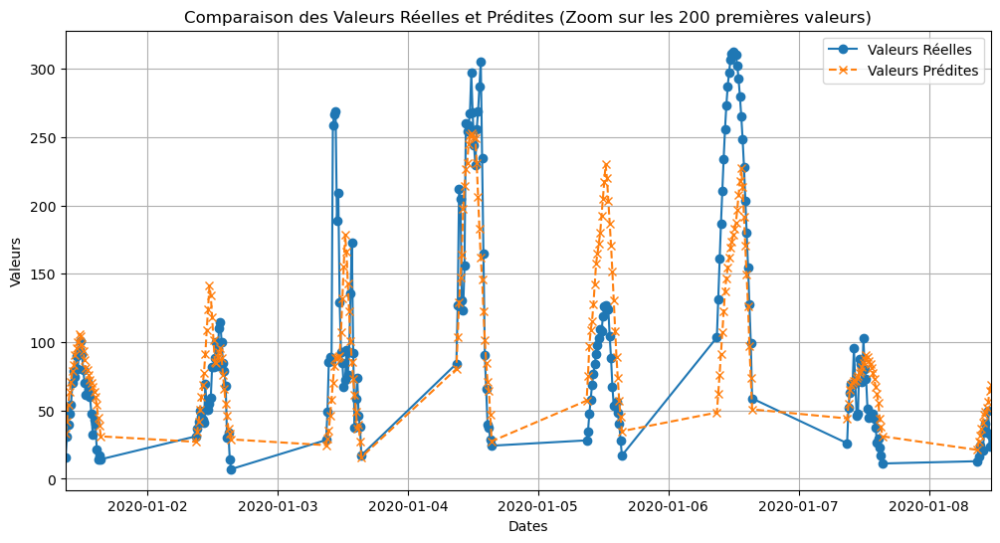

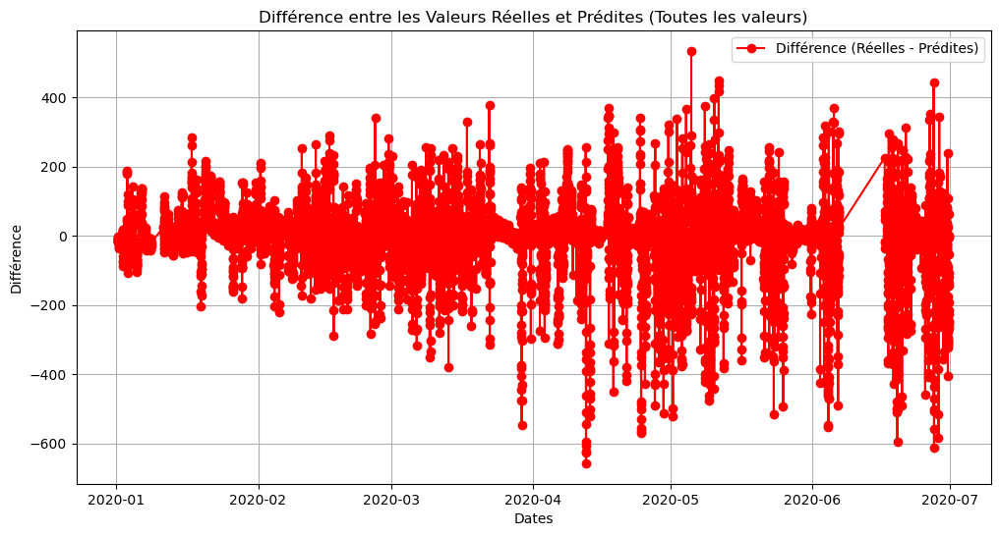

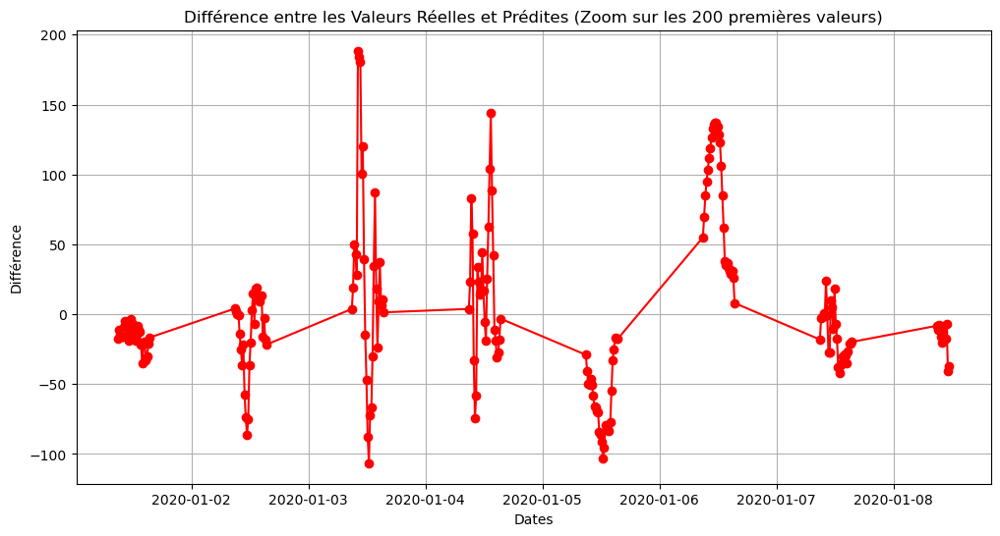

In [46]:
all_test_pred_graph(data_svr_poly[3],data_svr_poly[4])

The R² and MSE are a little bit better then when we used SVR linear, but DTW and MAE are higher (less good). Plus the graphs result of this SVR are really close to the ones of the last SVR. 

### SVR Radial Basis Function

SVR(C=1000.0)
MSE: 13425.59568708522
MAE: 72.27890463440094
R-squared: 0.8075990040908848
Distance DTW: 305220.73314048373


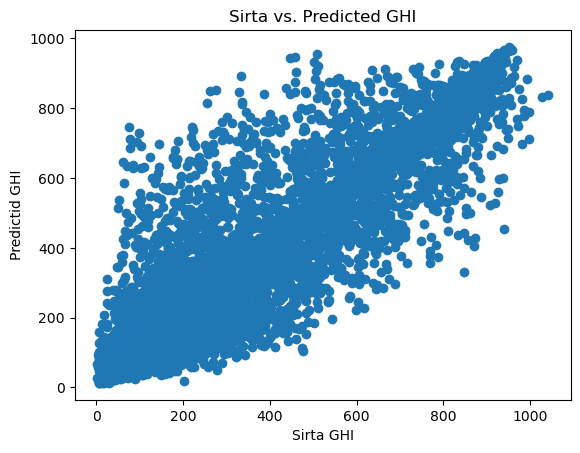

In [47]:
svr_rbf=SVR(kernel= 'rbf', C= 1e3)
data_svr_rbf=model_fit_prediction(df_train,df_test,svr_rbf)
evaluate_algo(svr_rbf,data_svr_rbf[3],data_svr_rbf[4])
scatter_test_pred(data_svr_rbf[3],data_svr_rbf[4])

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

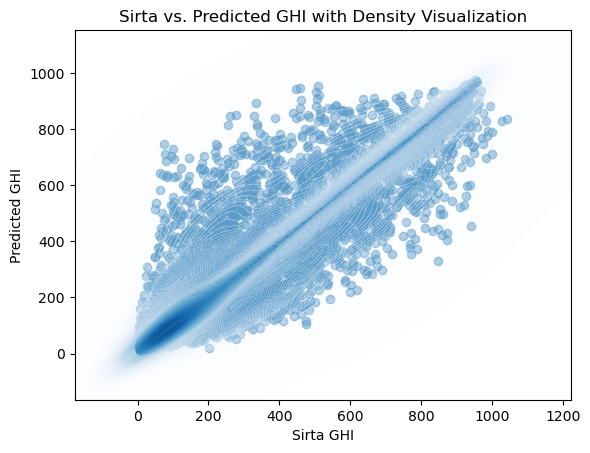

In [48]:
scatter_test_pred_density(data_svr_rbf[3],data_svr_rbf[4])

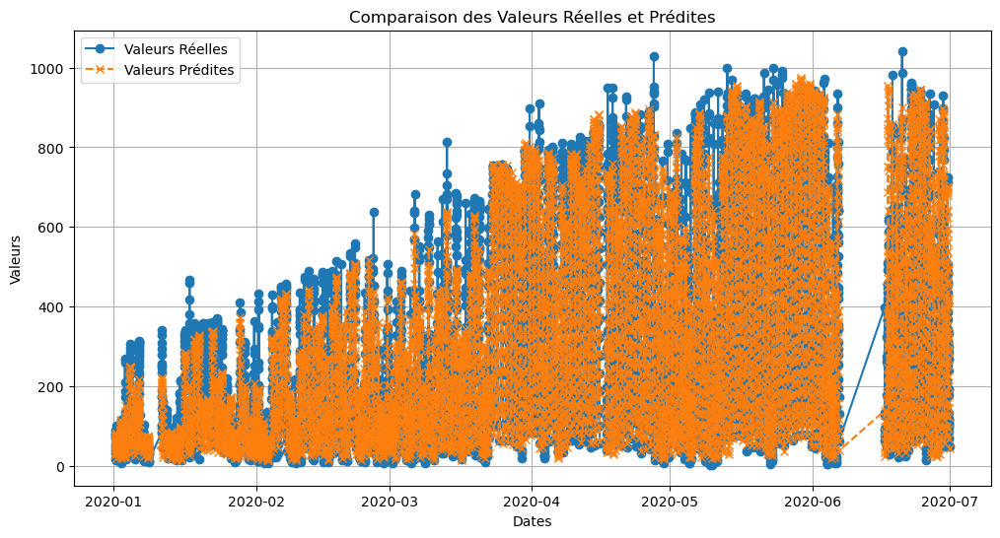

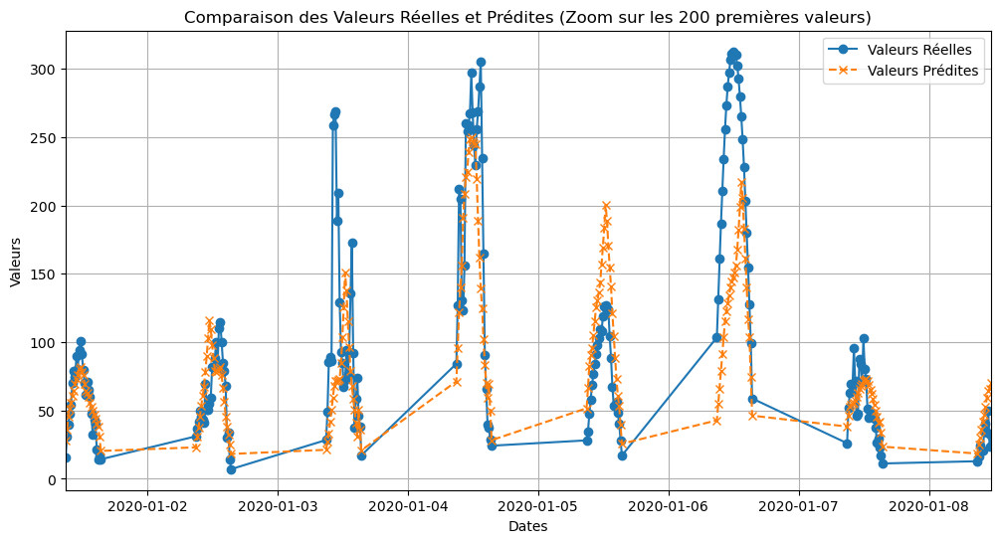

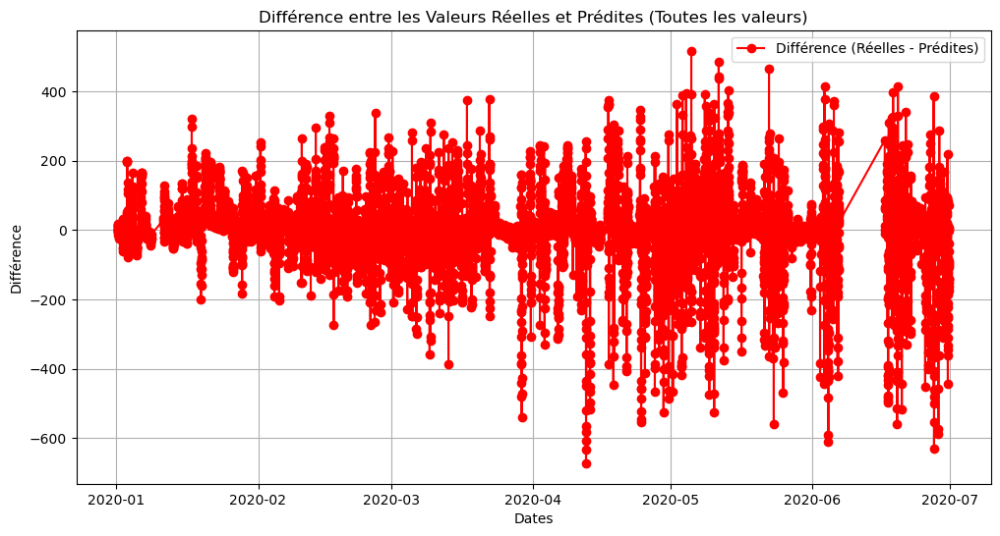

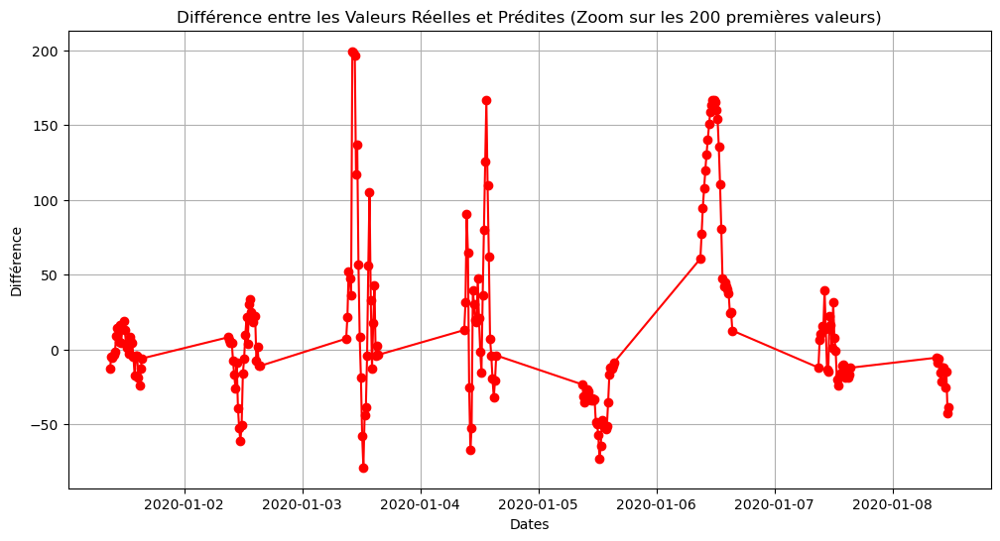

In [49]:
all_test_pred_graph(data_svr_rbf[3],data_svr_rbf[4])

### SVR Grid

Seeing the time of calculation for SVR (10min each time),we will use subset to run our SVR grid.

In [50]:
train_subset_data=df.iloc[:10260][columns_selection([360],False)]
test_subset_data=df.iloc[10260:11970][columns_selection([360],False)] 

In [51]:
svr=SVR()

In [52]:
X_train=train_subset_data.drop('Sirta_GHI',axis='columns')
Y_train=train_subset_data['Sirta_GHI']
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaler = scaler.transform(X_train)

In [53]:
parameters = {'kernel': ['linear','poly', 'rbf'], 'C': [100, 500, 1000], 'gamma': [0.001, 0.01, 0.1]}

#### ATTENTION LONG A CHARGER 
Fait avec donnée sur un an prediction de un mois et Sat 0T+360

In [54]:
test_hyperparameters(svr,parameters,X_train_scaler,Y_train)

(0.5903200730062382, SVR(C=100, gamma=0.001))

In [55]:
best_svr=SVR(kernel= 'rbf', C= 100, gamma=0.001)
data_best_svr=model_fit_prediction(df_train,df_test,best_svr)
evaluate_algo(best_svr,data_best_svr[3],data_best_svr[4])

SVR(C=100, gamma=0.001)
MSE: 13426.80261399179
MAE: 72.98563810537117
R-squared: 0.8075817077306915
Distance DTW: 315962.063153269


(13426.80261399179, 72.98563810537117, 0.8075817077306915, 315962.063153269)

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

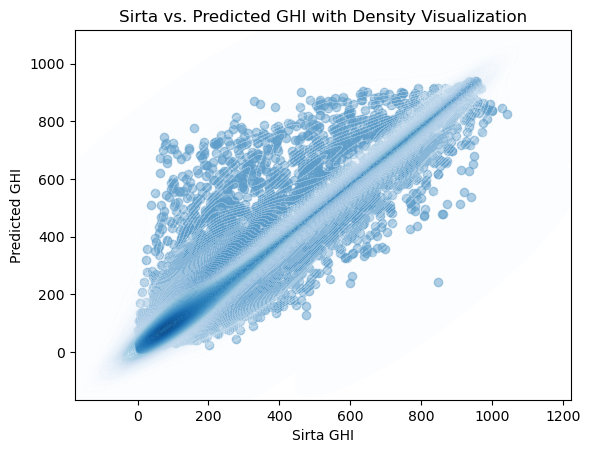

In [56]:
scatter_test_pred_density(data_best_svr[3],data_best_svr[4])

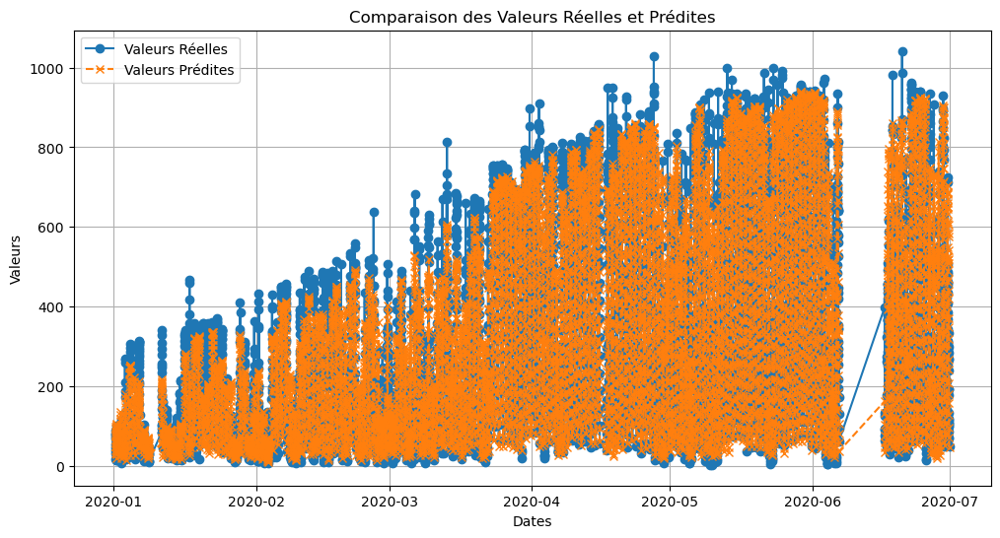

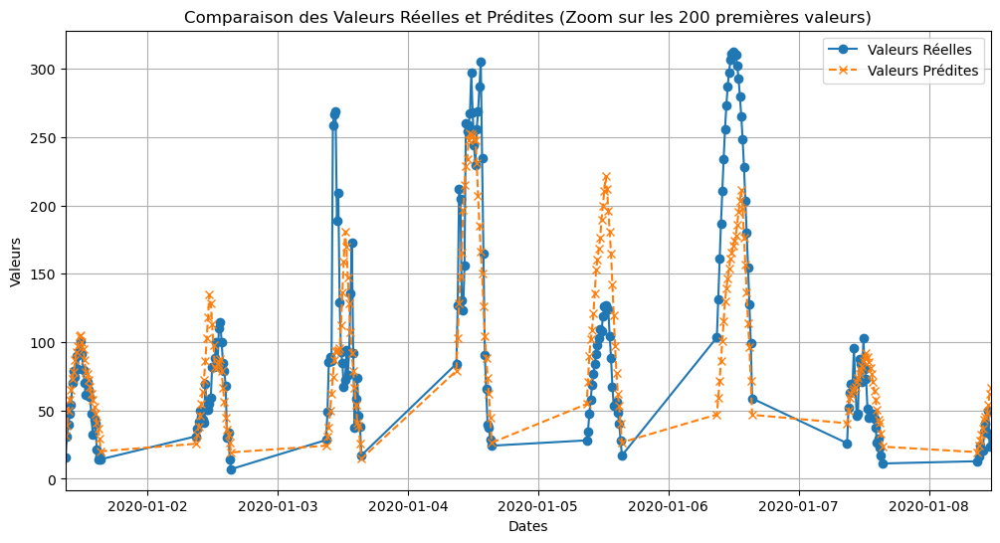

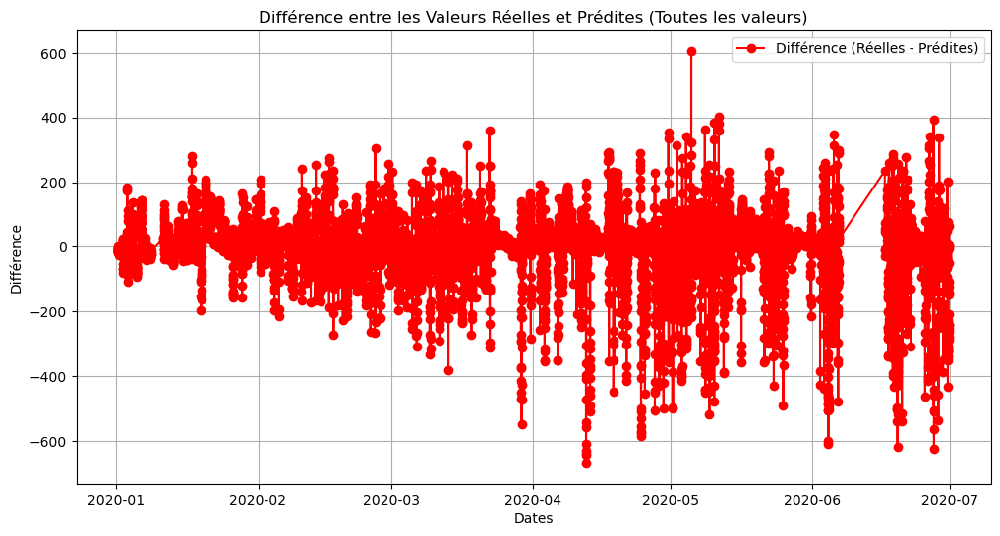

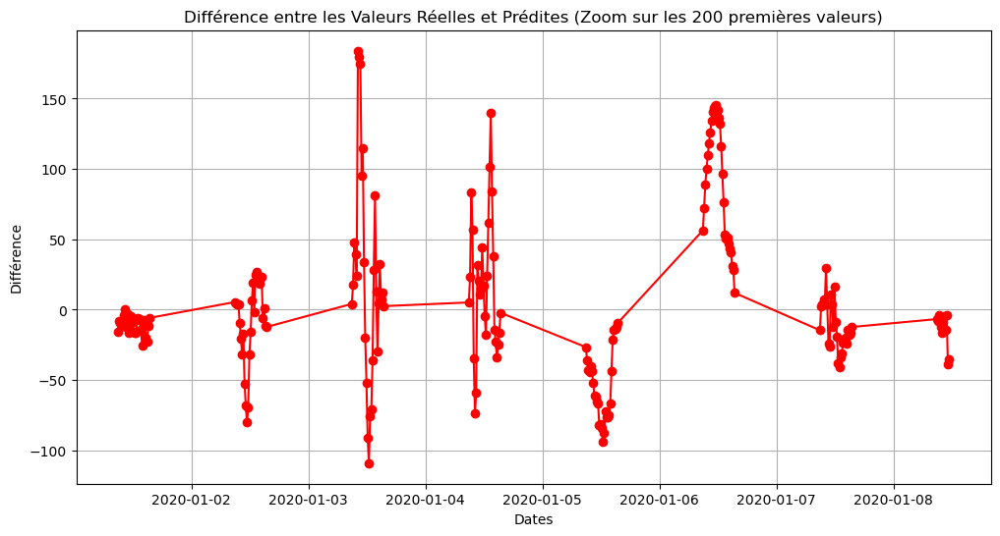

In [57]:
all_test_pred_graph(data_best_svr[3],data_best_svr[4])

# RandomForest

### First prediction

RandomForestRegressor()
MSE: 14186.071668701841
MAE: 80.39576056845442
R-squared: 0.7967006916704721
Distance DTW: 362329.56846821733


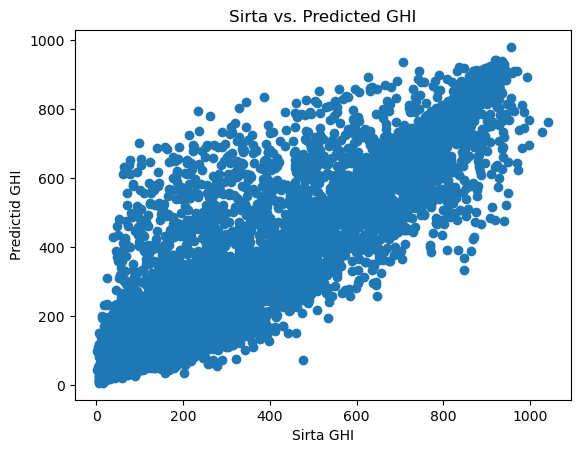

In [58]:
rfm=RandomForestRegressor()
data_rfm=model_fit_prediction(df_train,df_test,rfm)
evaluate_algo(rfm,data_rfm[3],data_rfm[4])
scatter_test_pred(data_rfm[3],data_rfm[4])

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

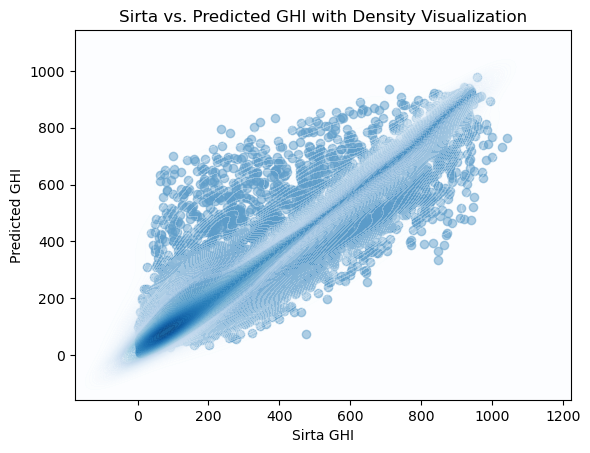

In [59]:
scatter_test_pred_density(data_rfm[3],data_rfm[4])

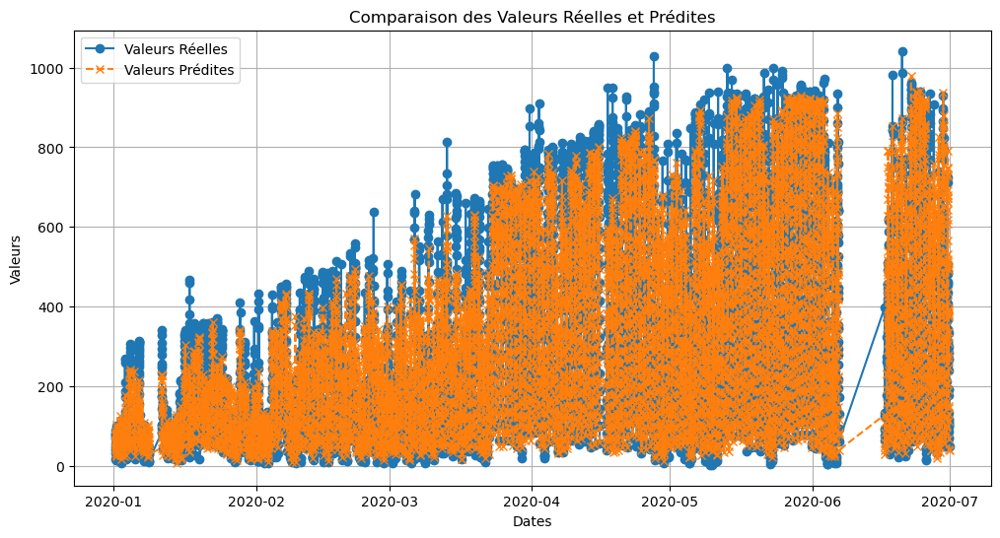

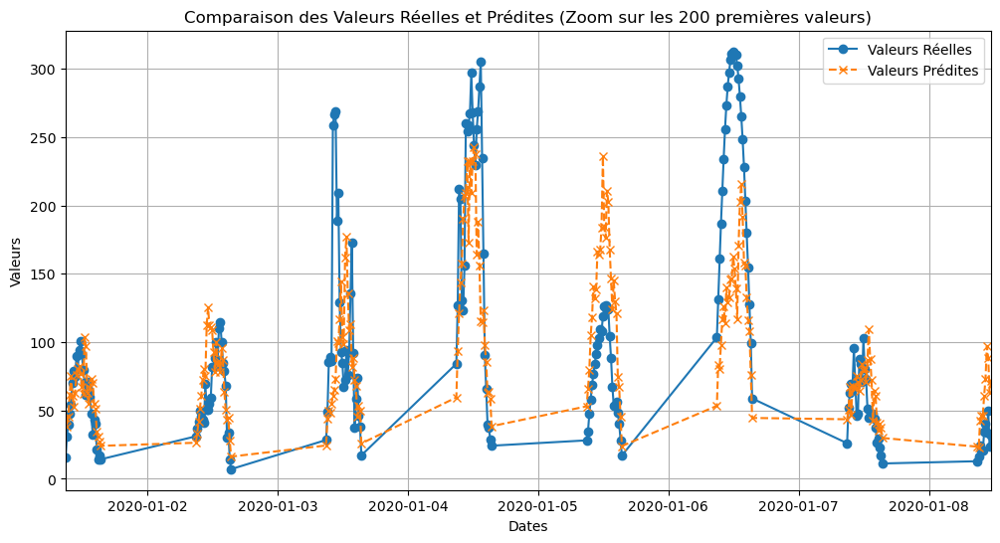

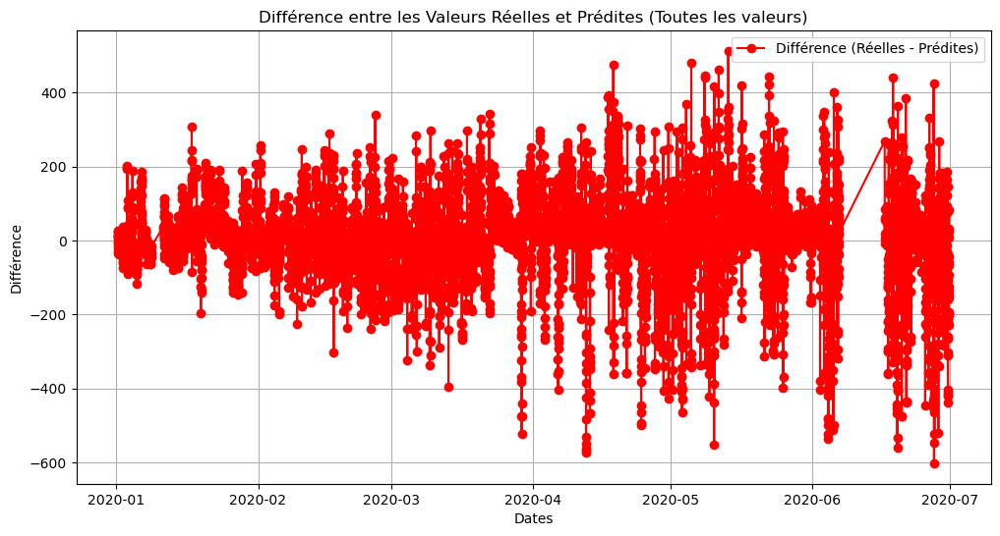

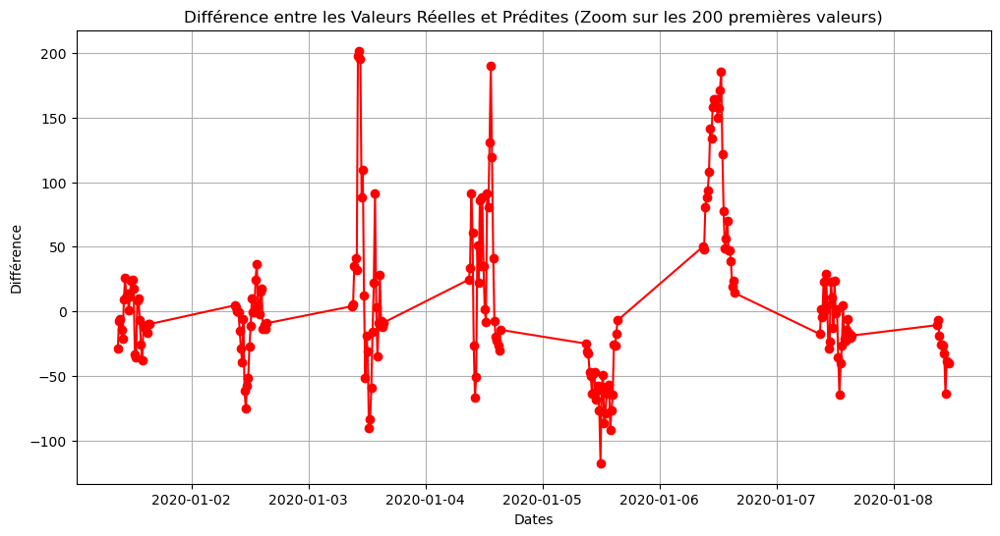

In [60]:
all_test_pred_graph(data_rfm[3],data_rfm[4])

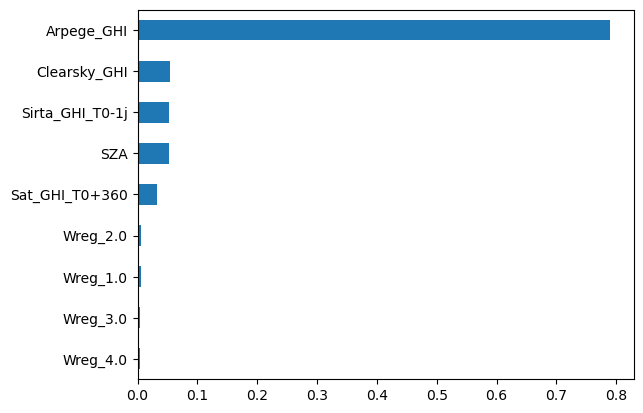

In [61]:
features_importance(data_rfm[5], data_rfm[0])

### RFM Grid

In [62]:
rfm=RandomForestRegressor()
X_train=train_subset_data.drop('Sirta_GHI',axis='columns')
Y_train=train_subset_data['Sirta_GHI']
scaler = preprocessing.StandardScaler().fit(X_train)
X_train_scaler = scaler.transform(X_train)

#### Each grid research take about 20/30 min

In [63]:
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

In [64]:
test_hyperparameters(rfm,param_grid,X_train_scaler,Y_train)

(0.560160413618035, RandomForestRegressor(max_depth=10, min_samples_leaf=2))

In [65]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [66]:
test_hyperparameters(rfm,param_grid,X_train_scaler,Y_train)

(0.5676910948869718,
 RandomForestRegressor(max_depth=10, min_samples_leaf=4, n_estimators=50))

In [67]:
param_grid = {
    'n_estimators': [125, 150, 175],
    'max_depth': [5,10,15],
    'min_samples_split': [10,15,20],
    'min_samples_leaf': [4,6]
}

In [68]:
test_hyperparameters(rfm,param_grid,X_train_scaler,Y_train)

(0.5757419467564562,
 RandomForestRegressor(max_depth=5, min_samples_leaf=6, min_samples_split=20,
                       n_estimators=175))

RandomForestRegressor(max_depth=5, min_samples_leaf=6, min_samples_split=20,
                      n_estimators=175)
MSE: 13036.814559899685
MAE: 81.28253501858721
R-squared: 0.8131705912148082
Distance DTW: 372066.61919060774


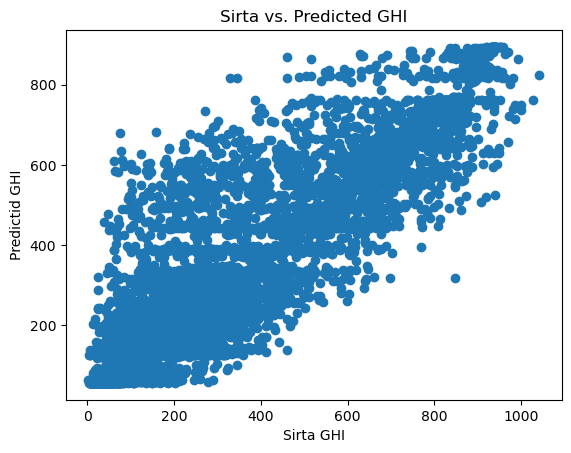

In [69]:
best_rfm=RandomForestRegressor(max_depth=5, min_samples_leaf=6, min_samples_split=20, n_estimators=175)
data_best_rfm=model_fit_prediction(df_train,df_test,best_rfm)
evaluate_algo(best_rfm,data_best_rfm[3],data_best_rfm[4])
scatter_test_pred(data_best_rfm[3],data_best_rfm[4])

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

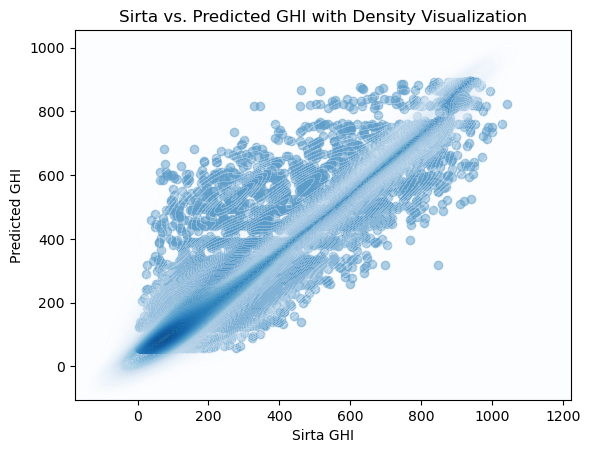

In [70]:
scatter_test_pred_density(data_best_rfm[3],data_best_rfm[4])

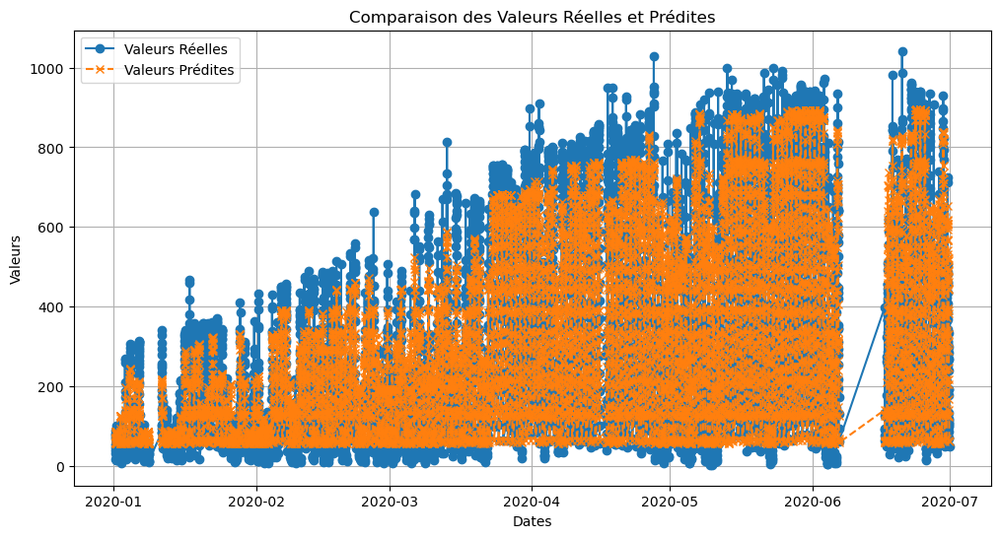

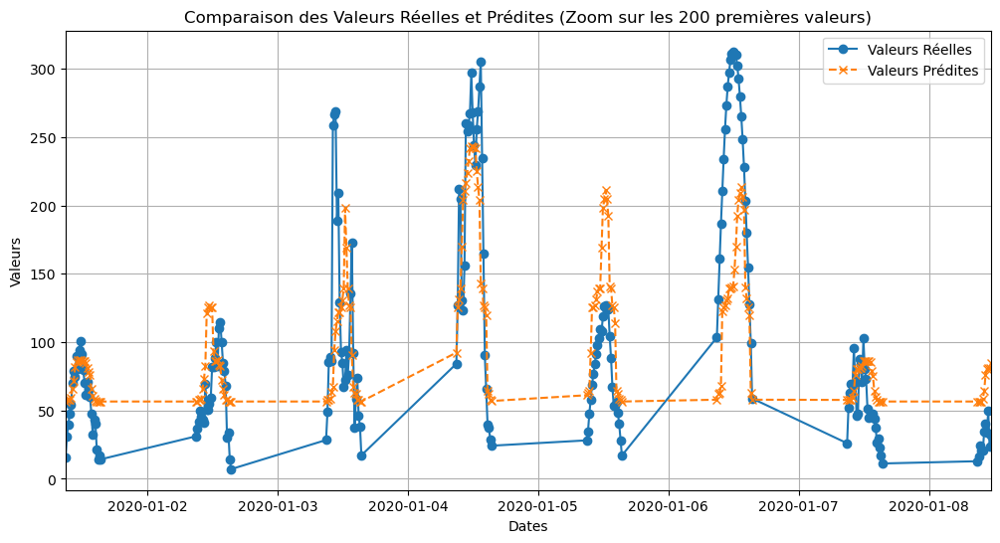

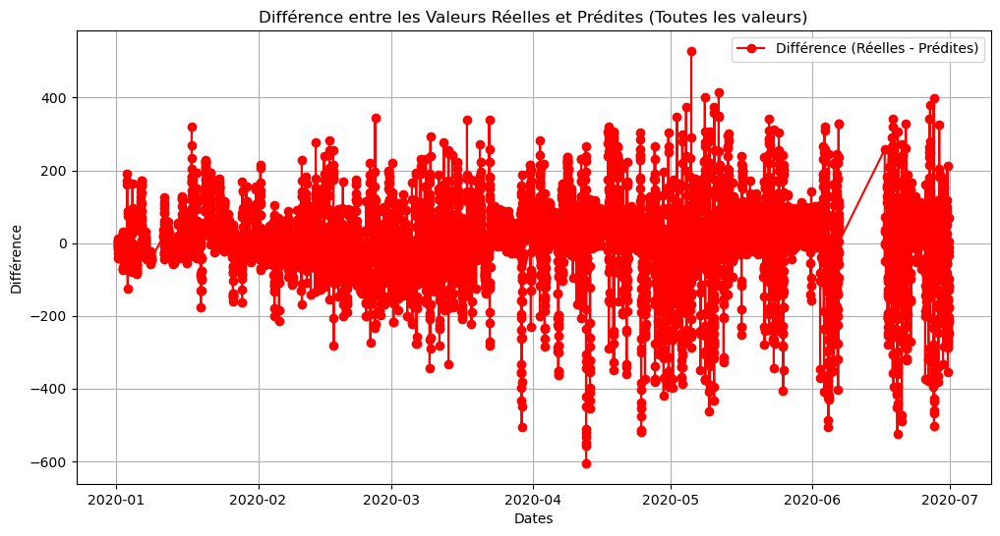

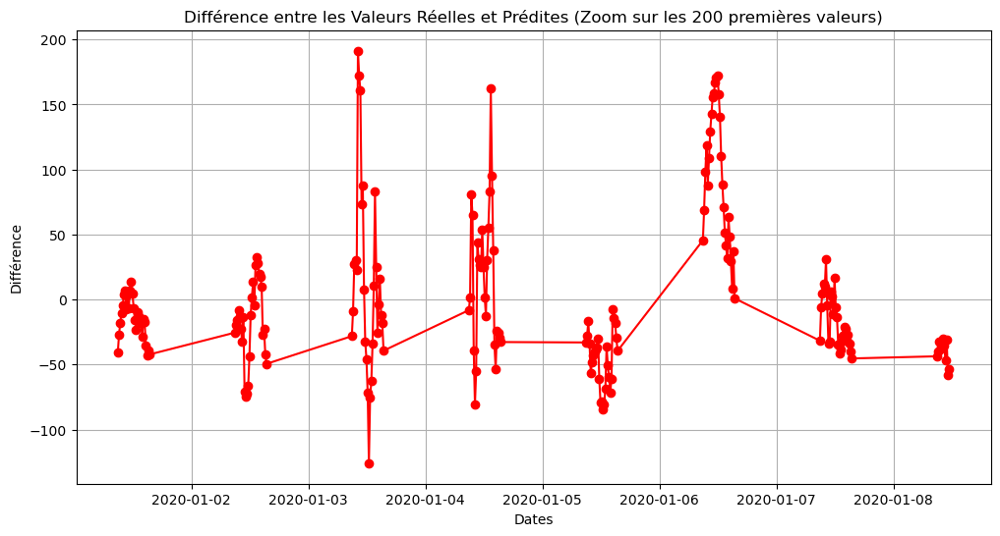

In [71]:
all_test_pred_graph(data_best_rfm[3],data_best_rfm[4])

### RFM Cross-Validation 

In [72]:
rfm=RandomForestRegressor()
X=df[columns_selection([360],False)].drop('Sirta_GHI',axis=1)
y=df['Sirta_GHI']

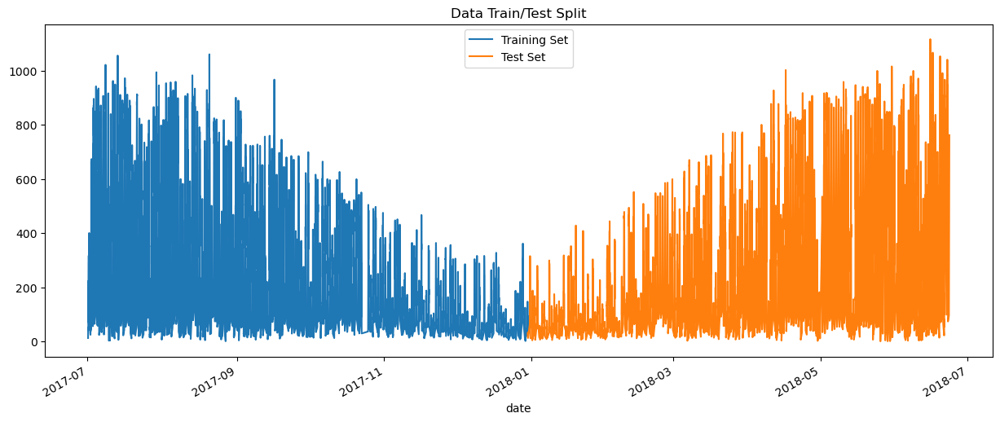

RandomForestRegressor()
MSE: 19012.833344012022
MAE: 95.8183446899277
R-squared: 0.7000065146373944
Distance DTW: 419616.9390321195


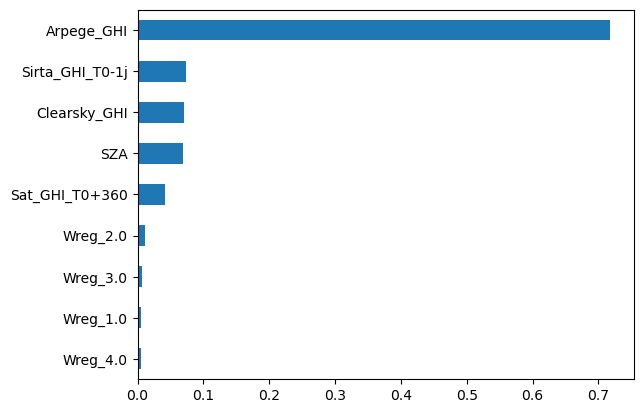

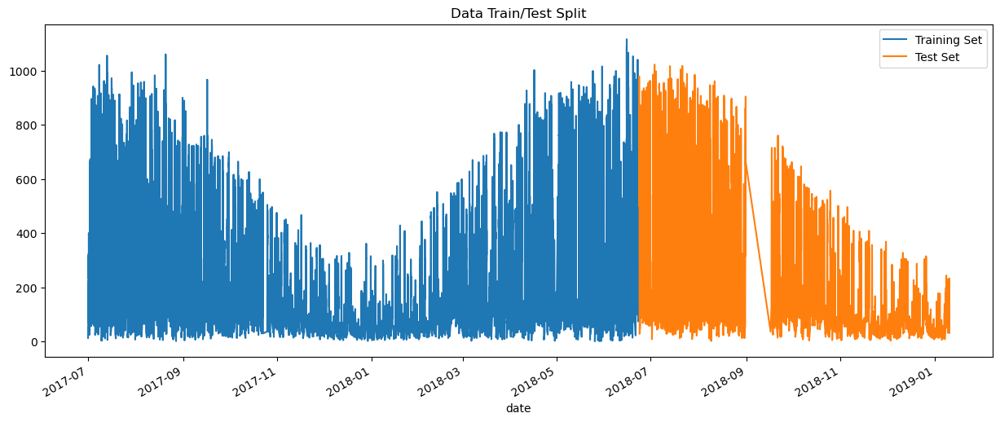

RandomForestRegressor()
MSE: 14481.753793484995
MAE: 81.83619612800508
R-squared: 0.7846156858247038
Distance DTW: 523011.6907924254


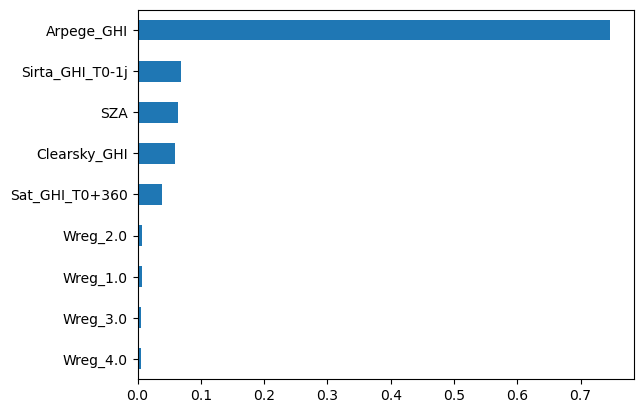

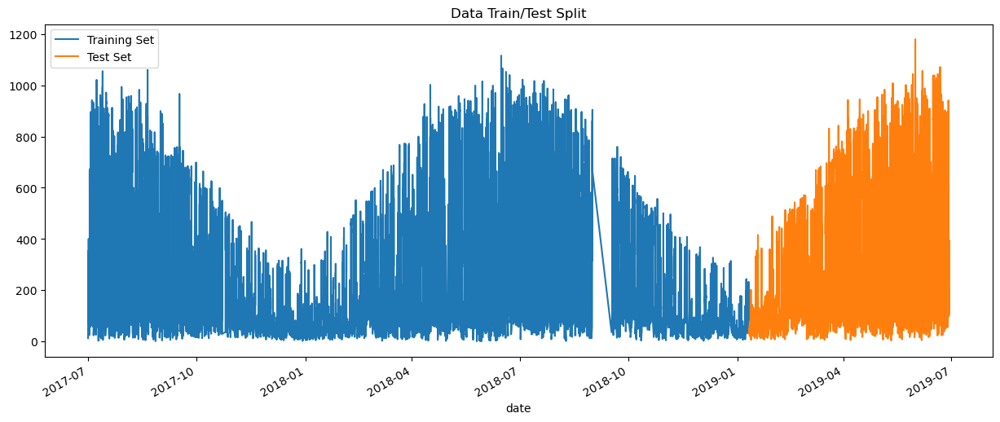

RandomForestRegressor()
MSE: 17079.877408174034
MAE: 92.22756804658127
R-squared: 0.7344231836002166
Distance DTW: 400370.07223128795


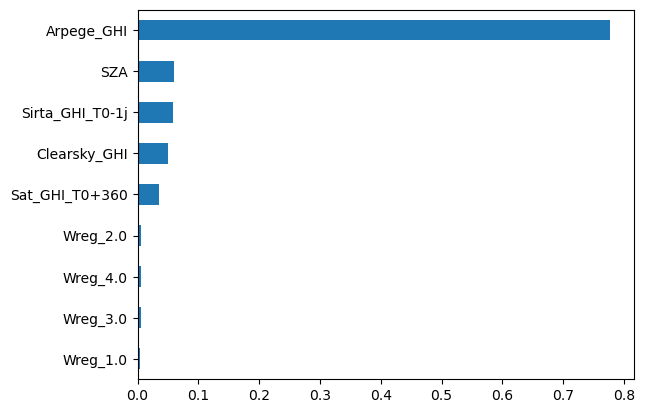

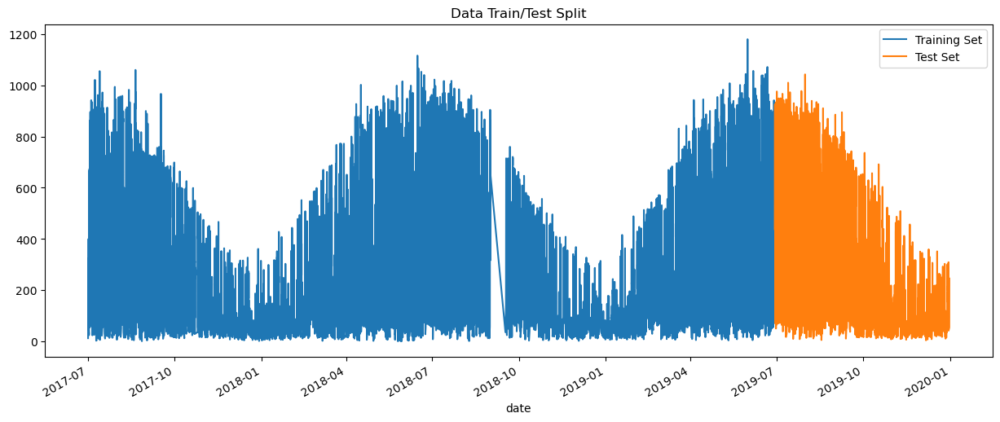

RandomForestRegressor()
MSE: 14507.79986588949
MAE: 81.0894755778654
R-squared: 0.7775853336272182
Distance DTW: 368363.1414463882


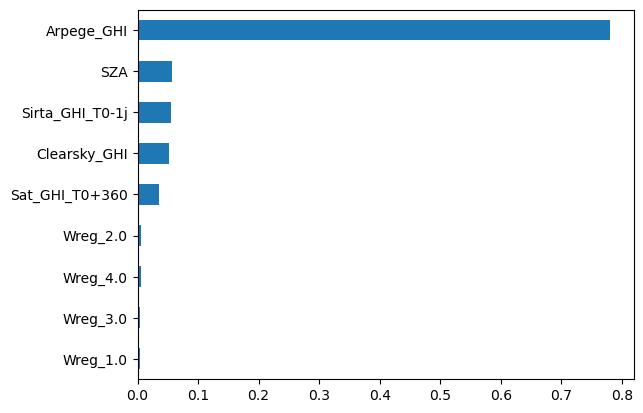

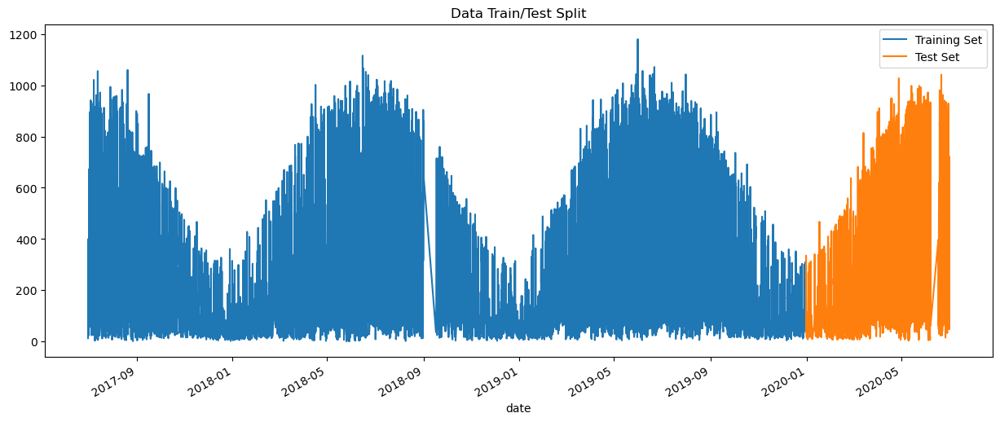

RandomForestRegressor()
MSE: 14099.288013267276
MAE: 80.43964771869646
R-squared: 0.7975889646663148
Distance DTW: 348679.0826346094


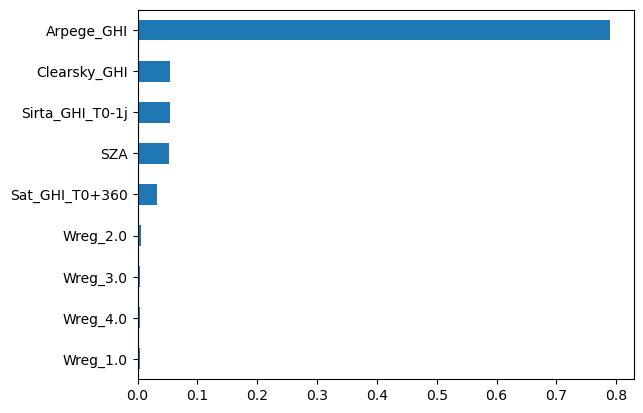

In [73]:
cross_val(rfm,X,y,graph=True)

## GMDH

MSE: 13586.4925262984
MAE: 86.23534528329814
R-squared: 0.8052932060596643
Distance DTW: 435168.03816080984


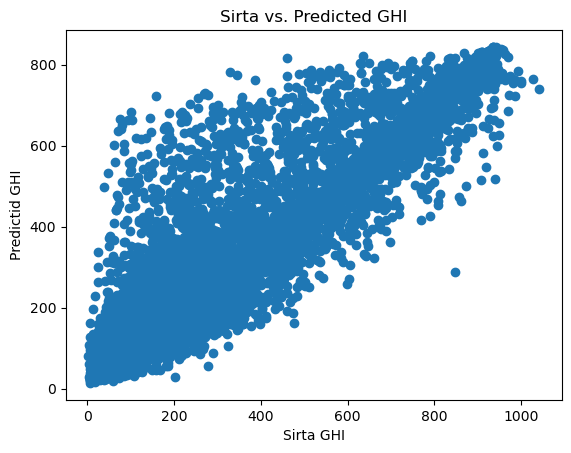

In [74]:
GMDH=Combi()
data_gmdh=model_fit_prediction(df_train,df_test, GMDH)
evaluate_algo(GMDH,data_gmdh[3],data_gmdh[4])
scatter_test_pred(data_gmdh[3],pd.Series(data_gmdh[4]))

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.opti

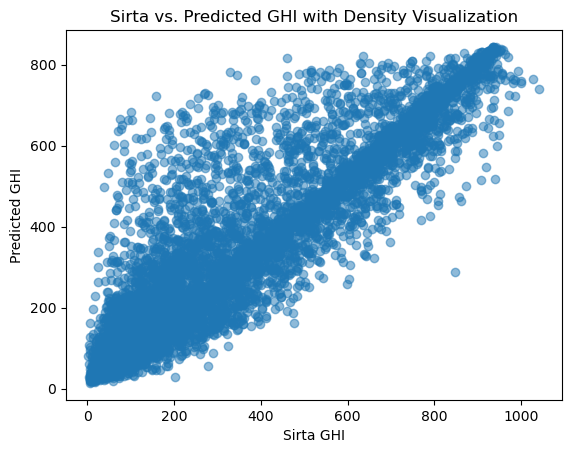

In [75]:
scatter_test_pred_density(data_gmdh[3],pd.Series(data_gmdh[4]))

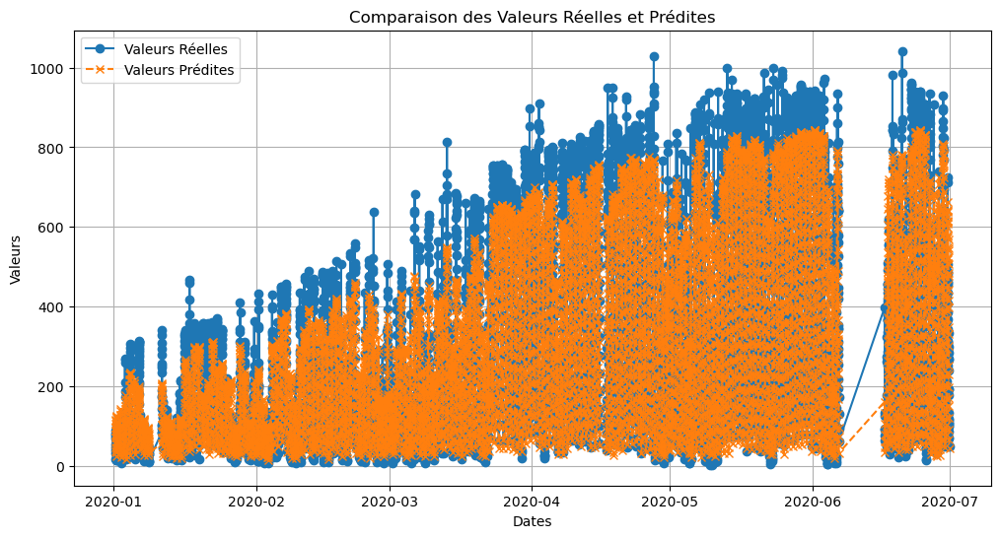

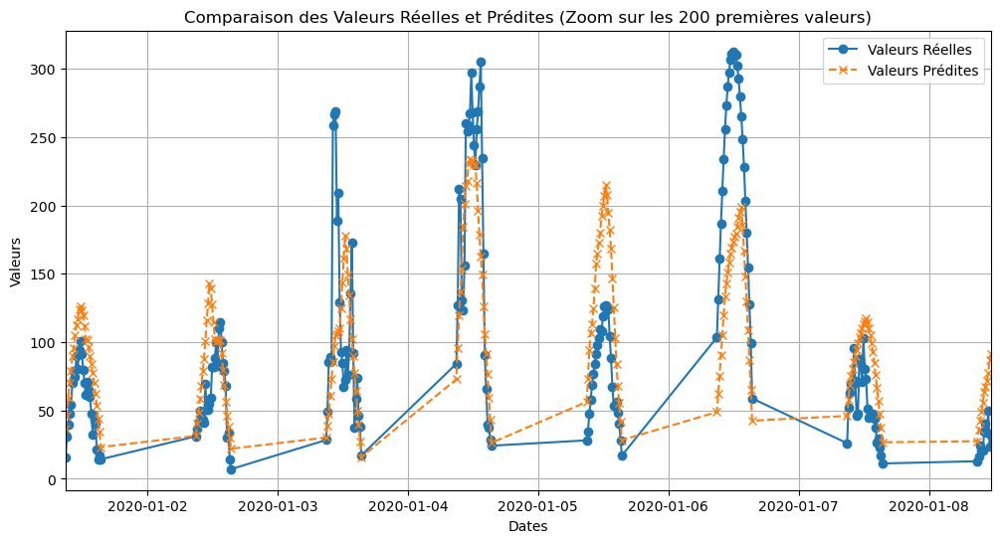

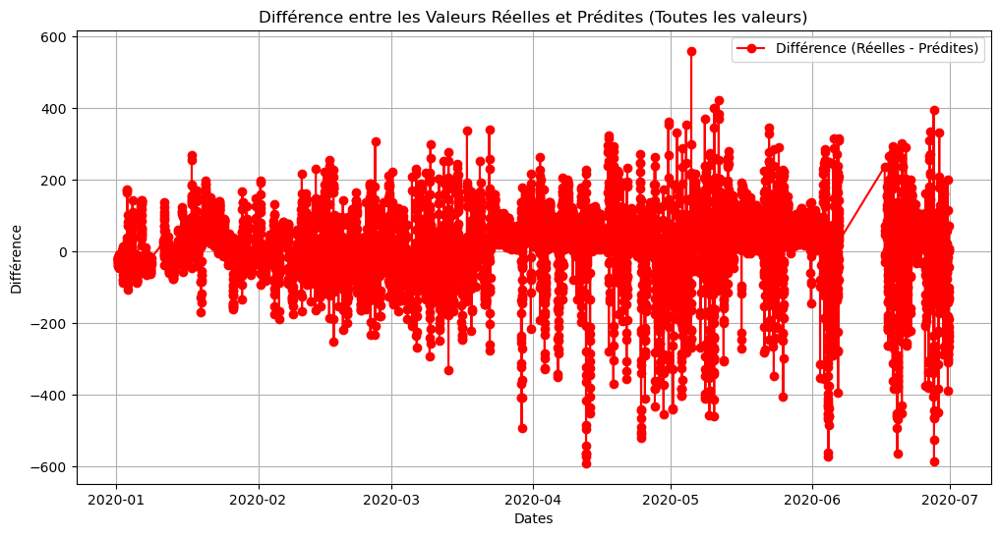

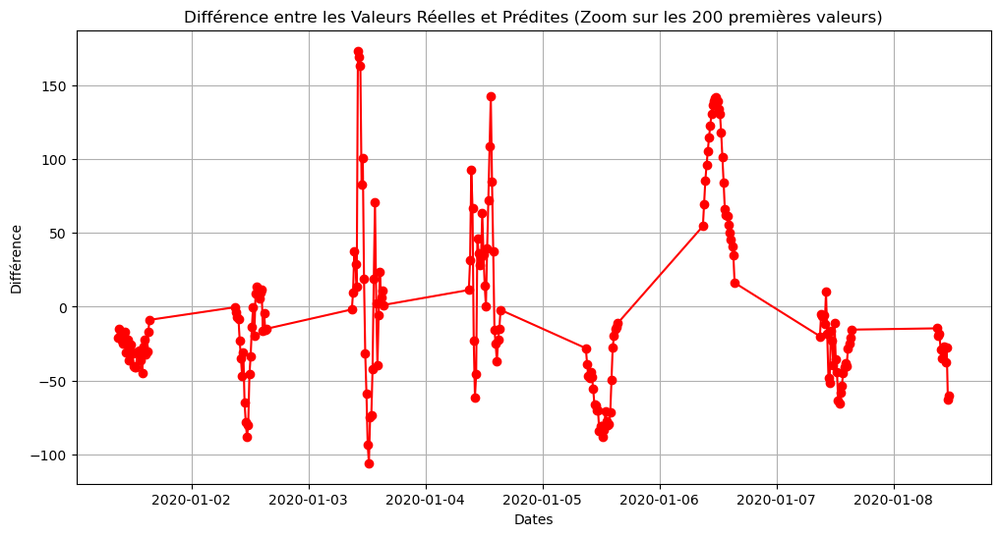

In [76]:
all_test_pred_graph(data_gmdh[3],data_gmdh[4])

# Depending on Satellite time RFM

In [77]:
Sat_num=list(range(0, 361, 15))
train_subset_data=df.loc[df.index < '01-01-2020'][columns_selection(Sat_num,False)]
test_subset_data=df.loc[df.index >= '01-01-2020'][columns_selection(Sat_num,False)]
rfm=RandomForestRegressor()
df_sat_ev_rfm=try_sat(rfm,train_subset_data,test_subset_data,6)

RandomForestRegressor()
MSE: 14147.734704346487
MAE: 80.54116821070018
R-squared: 0.7972500952346803
Distance DTW: 359681.6552694659
360
RandomForestRegressor()
MSE: 13242.563463990802
MAE: 77.61992495687036
R-squared: 0.8102220223038272
Distance DTW: 337015.89683724503
270
RandomForestRegressor()
MSE: 11853.684636338929
MAE: 71.52935032337857
R-squared: 0.8301259189997748
Distance DTW: 306689.79700273013
180
RandomForestRegressor()
MSE: 9424.778858241518
MAE: 61.77192508791947
R-squared: 0.8649343477330258
Distance DTW: 280383.7976980118
90
RandomForestRegressor()
MSE: 5428.379520317993
MAE: 46.87145102104633
R-squared: 0.9222063847128575
Distance DTW: 231738.55479199448
0


In [78]:
df_sat_ev_rfm.set_index('Index', inplace=True)

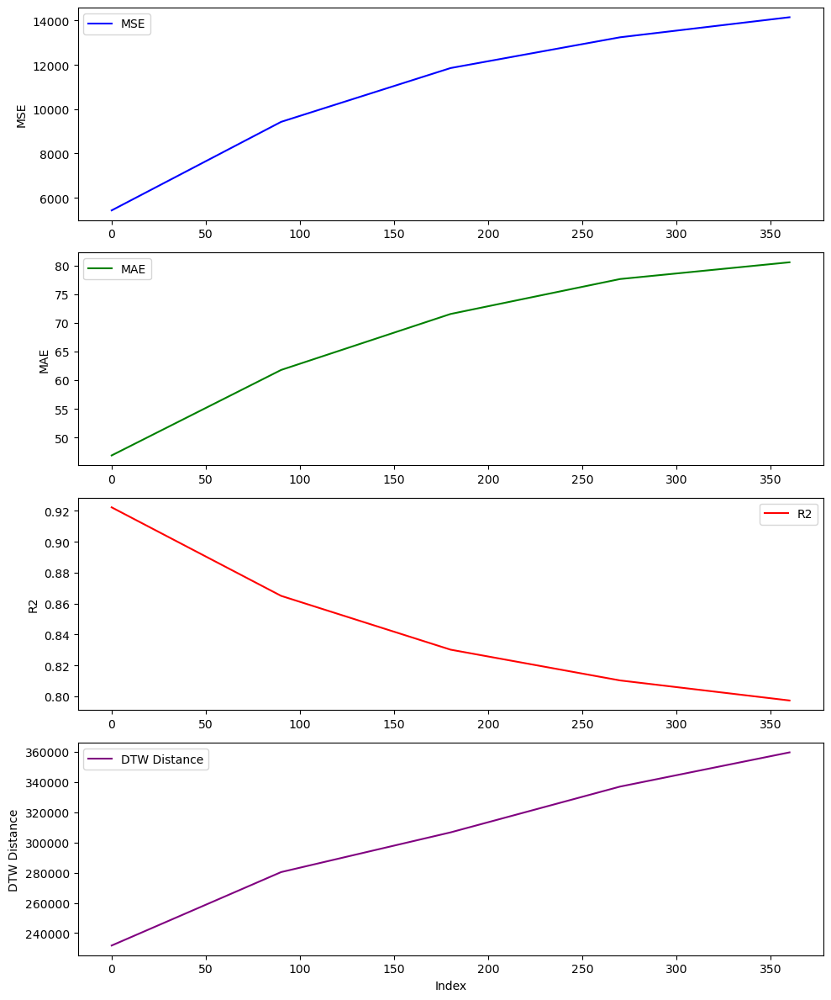

In [79]:
mesures_results(df_sat_ev_rfm)